# Introducción

IMPORTANTE: se va a notar que la base de datos está desbalanceada, lo veremos al obtener los modelos.

Input variables:

Bank client data:

1. age (numeric)
2. job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
3. marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
4. education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
5. default: has credit in default? (categorical: 'no','yes','unknown')
6. housing: has housing loan? (categorical: 'no','yes','unknown')
7. loan: has personal loan? (categorical: 'no','yes','unknown')
related with the last contact of the current campaign:
8. contact: contact communication type (categorical: 'cellular','telephone')
9. month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
10. day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
11. duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.

Other attributes:

12. campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
13. pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
14. previous: number of contacts performed before this campaign and for this client (numeric)
15. poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')

Social and economic context attributes:

16. emp.var.rate: employment variation rate - quarterly indicator (numeric)
17. cons.price.idx: consumer price index - monthly indicator (numeric)
18. cons.conf.idx: consumer confidence index - monthly indicator (numeric)
19. euribor3m: euribor 3 month rate - daily indicator (numeric)
20. nr.employed: number of employees - quarterly indicator (numeric)

Output variable (desired target):

21. y - has the client subscribed a term deposit? (binary: 'yes','no')


In [55]:
# IMPORTS
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pingouin as pg
from scipy import stats
from sklearn import preprocessing
import scipy.stats as ss
import pickle

np.random.seed(42) # Fijar semilla random

In [7]:
import sys
sys.path.append('../../')
nombre_archivo = "../../BankMarketing/bank-additional-full.csv"

data = pd.read_csv(nombre_archivo, sep=';', quotechar='"')
data.drop('duration', axis=1, inplace = True)

# Limpieza de datos


Vemos primero un resumen de los datos y lo analizamos.

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  campaign        41188 non-null  int64  
 11  pdays           41188 non-null  int64  
 12  previous        41188 non-null  int64  
 13  poutcome        41188 non-null  object 
 14  emp.var.rate    41188 non-null  float64
 15  cons.price.idx  41188 non-null  float64
 16  cons.conf.idx   41188 non-null  float64
 17  euribor3m       41188 non-null 

In [9]:
data.describe(include='all')

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
count,41188.00000,41188,41188,41188,41188,41188,41188,41188,41188,41188,41188.000000,41188.000000,41188.000000,41188,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188
unique,NaN,12,4,8,3,3,3,2,10,5,NaN,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,2
top,NaN,admin.,married,university.degree,no,yes,no,cellular,may,thu,NaN,NaN,NaN,nonexistent,NaN,NaN,NaN,NaN,NaN,no
freq,NaN,10422,24928,12168,32588,21576,33950,26144,13769,8623,NaN,NaN,NaN,35563,NaN,NaN,NaN,NaN,NaN,36548
mean,40.02406,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.567593,962.475454,0.172963,NaN,0.081886,93.575664,-40.502600,3.621291,5167.035911,NaN
std,10.42125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.770014,186.910907,0.494901,NaN,1.570960,0.578840,4.628198,1.734447,72.251528,NaN
min,17.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000,0.000000,NaN,-3.400000,92.201000,-50.800000,0.634000,4963.600000,NaN
25%,32.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,999.000000,0.000000,NaN,-1.800000,93.075000,-42.700000,1.344000,5099.100000,NaN
50%,38.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,999.000000,0.000000,NaN,1.100000,93.749000,-41.800000,4.857000,5191.000000,NaN
75%,47.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.000000,999.000000,0.000000,NaN,1.400000,93.994000,-36.400000,4.961000,5228.100000,NaN


## Valores Nulls


No hay.

# Feature Engeenering

## Análisis Exploratorio de Datos (EDA)

Veamos las distribuciones iniciales.

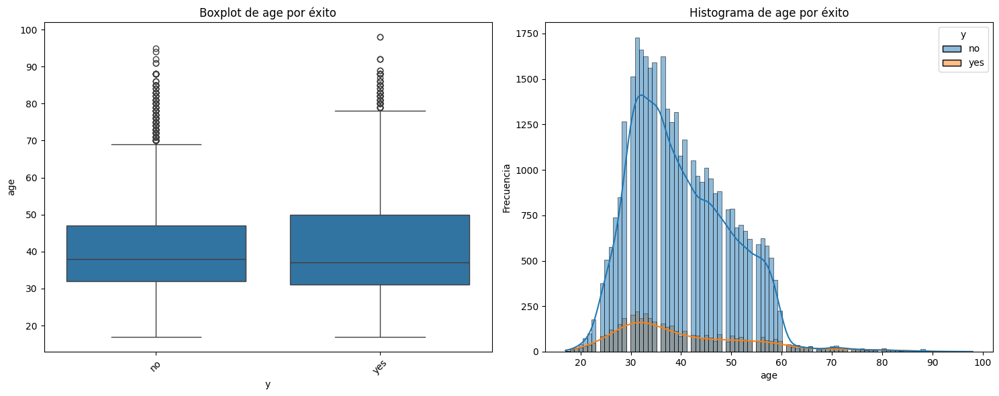

In [10]:
var='age'
plt.figure(figsize=(15, 6))

# Boxplot
plt.subplot(1, 2, 1) # 1 fila, 2 columnas, primera posición
sns.boxplot(x='y', y=var, data=data)
plt.xticks(rotation=45)
plt.title('Boxplot de '+var+' por éxito')

# Histograma
plt.subplot(1, 2, 2) # 1 fila, 2 columnas, segunda posición
sns.histplot(x=var, data=data, hue='y', kde=True)
plt.title('Histograma de '+var+' por éxito')
plt.xlabel(var)
plt.ylabel('Frecuencia')

plt.tight_layout() # Ajusta automáticamente la disposición de las subgráficas
plt.show()

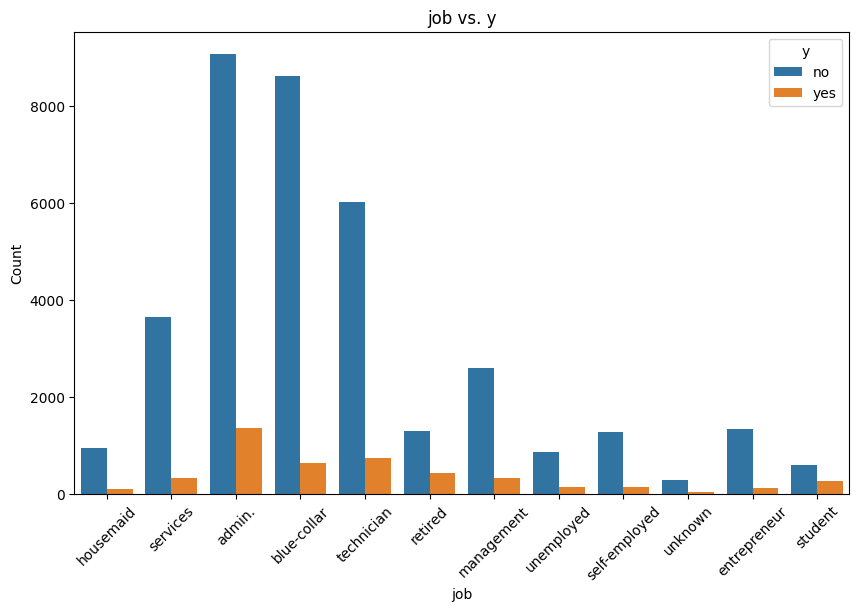

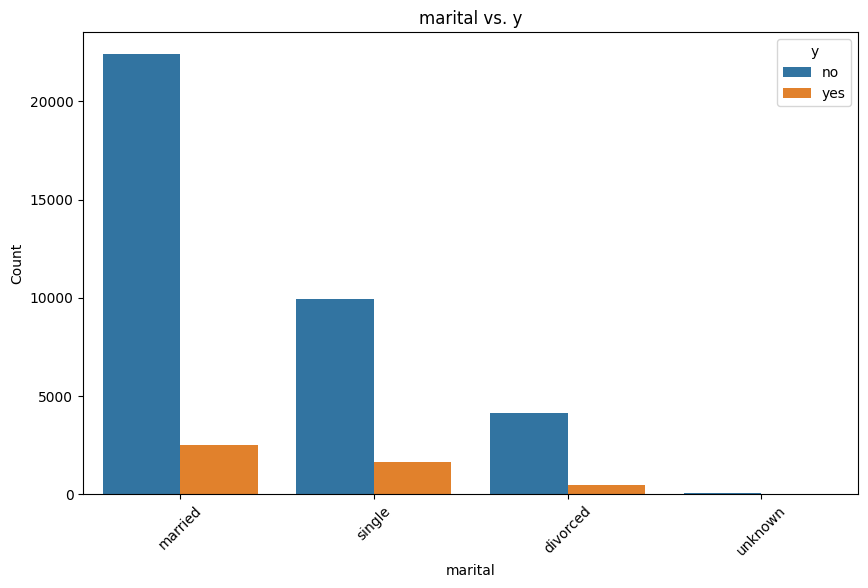

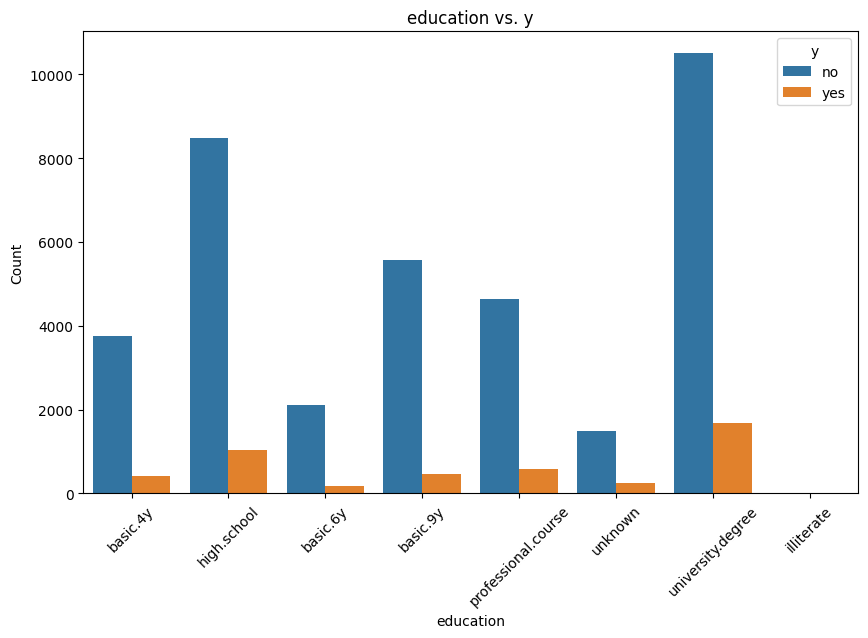

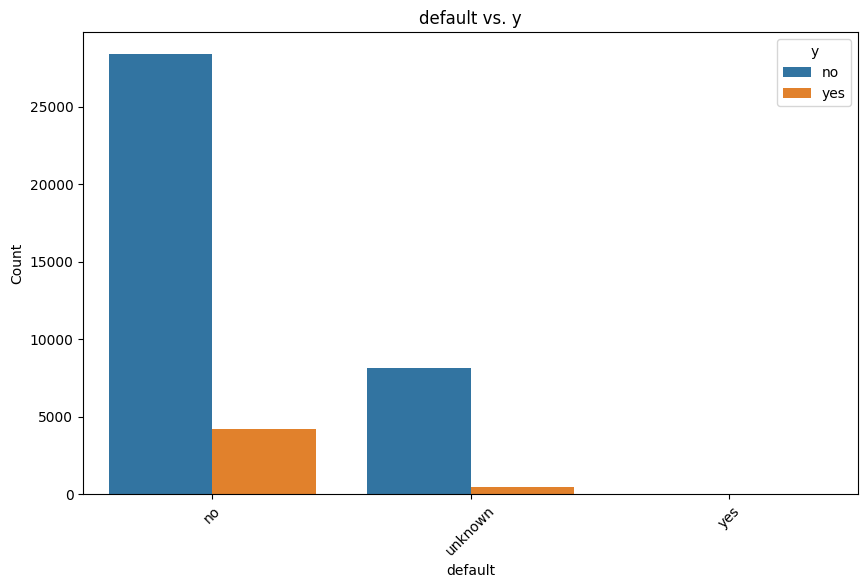

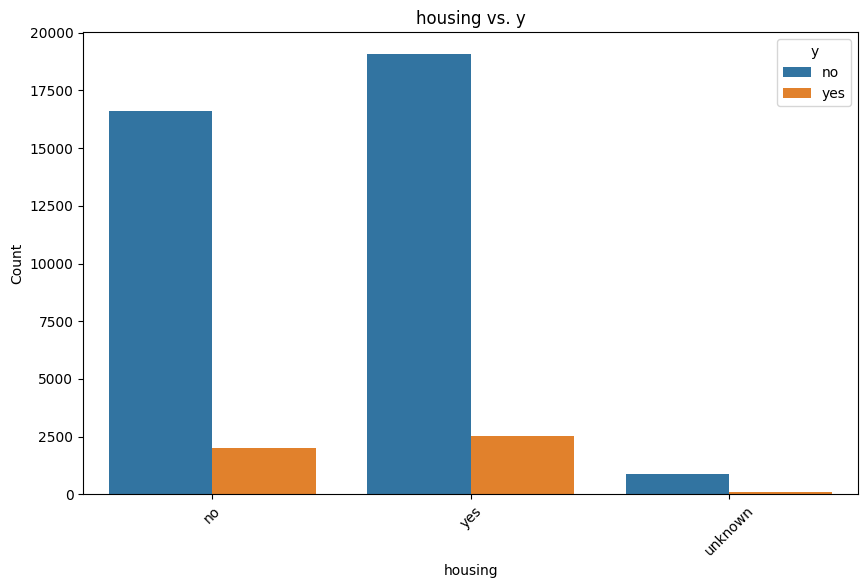

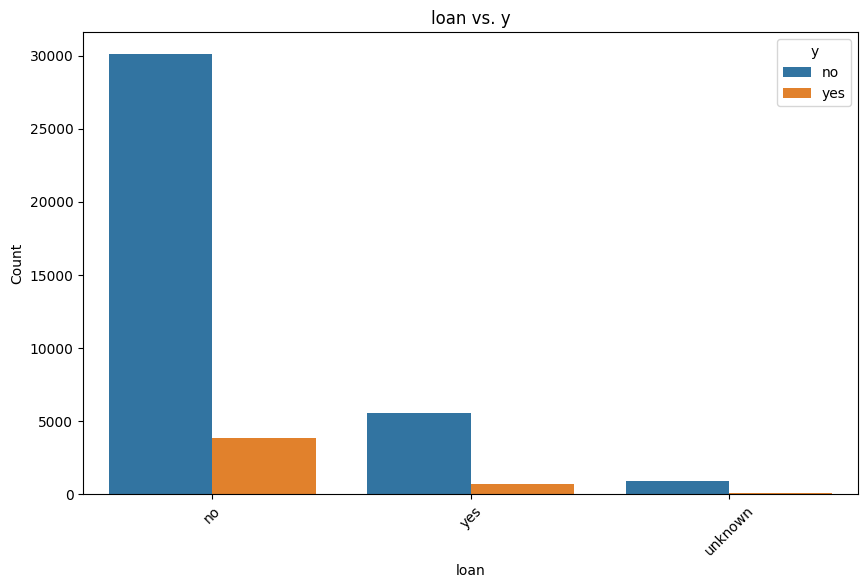

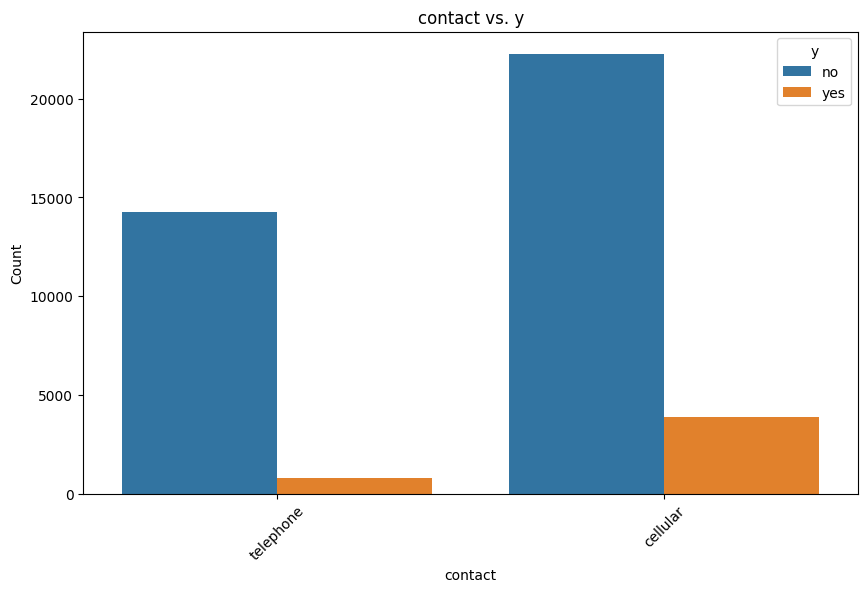

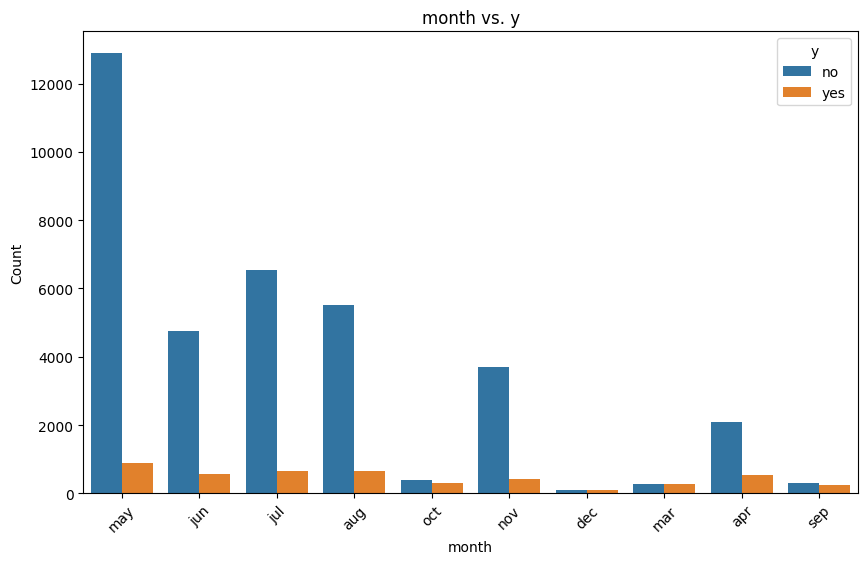

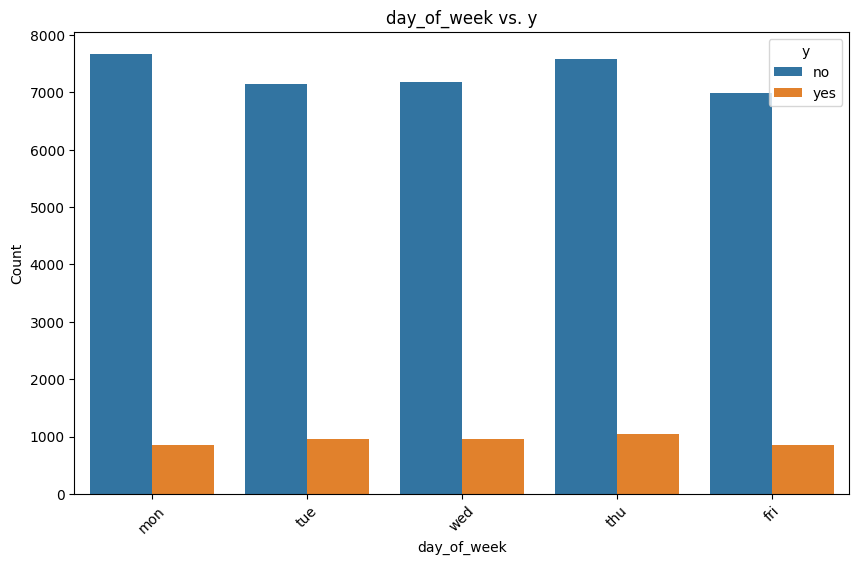

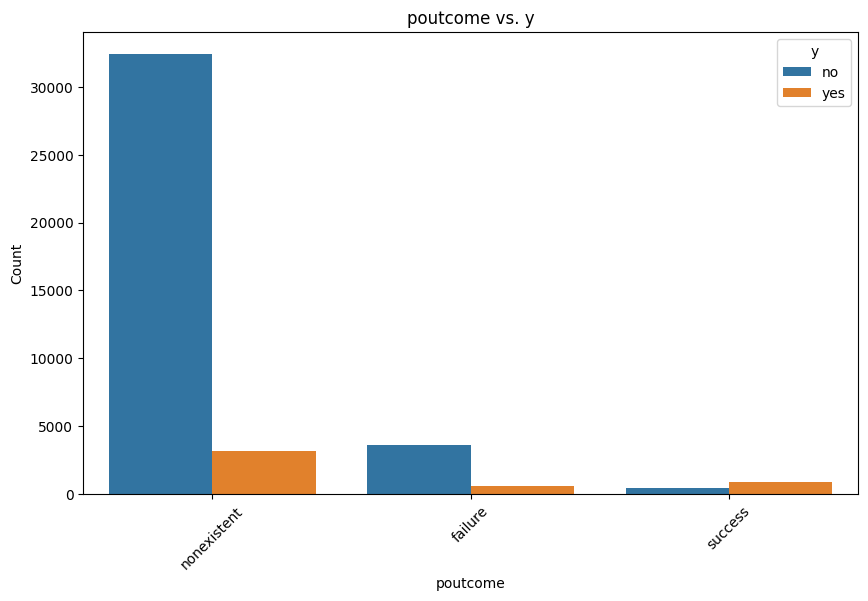

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


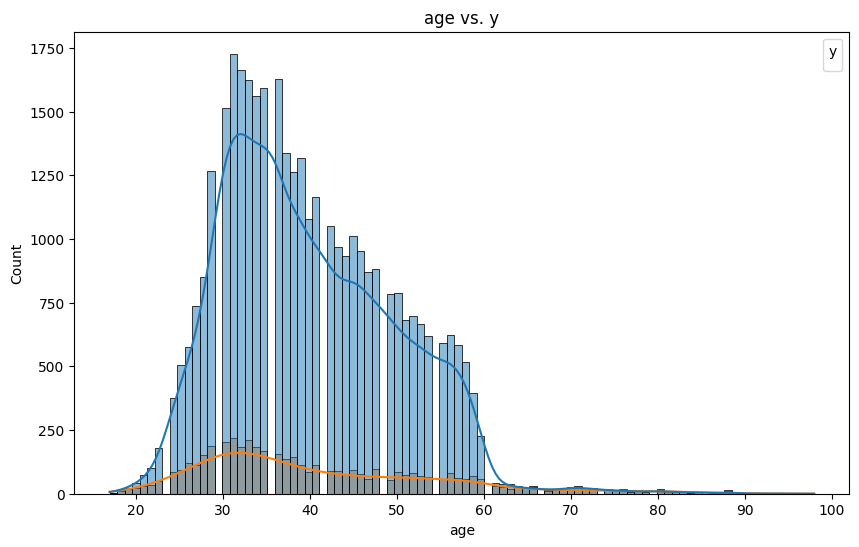

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


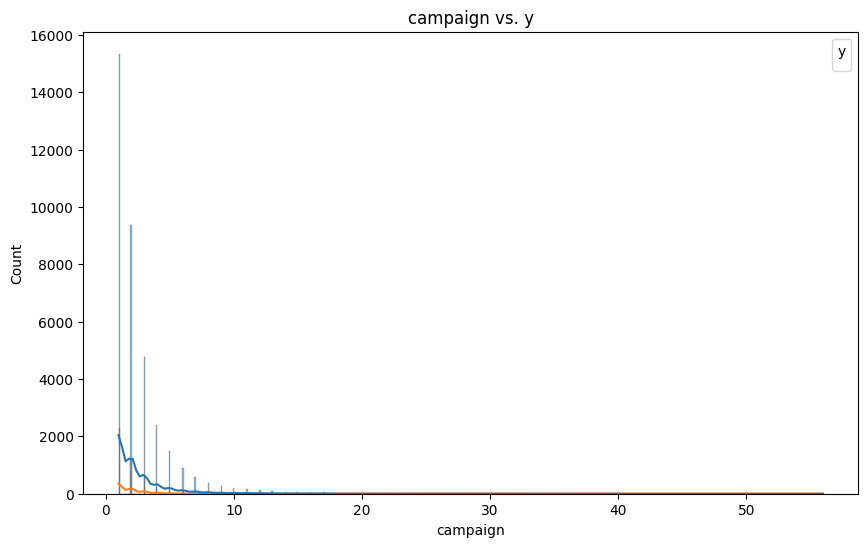

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


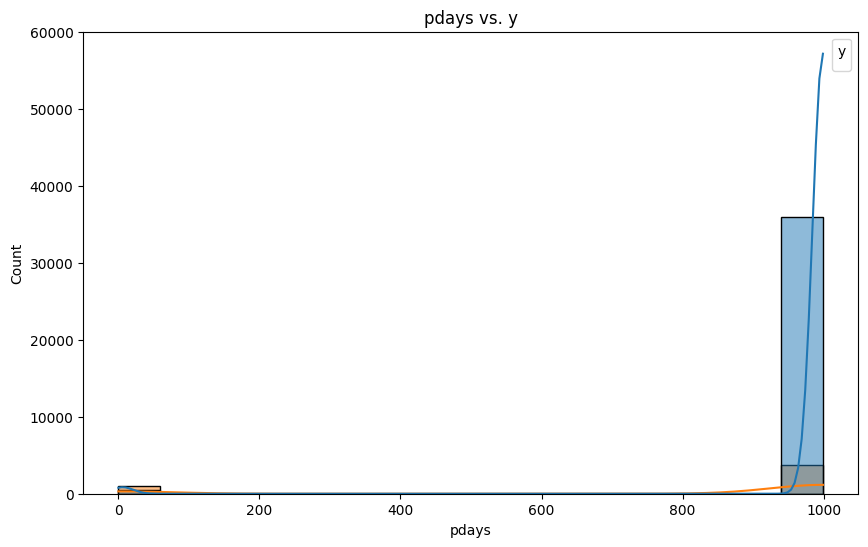

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


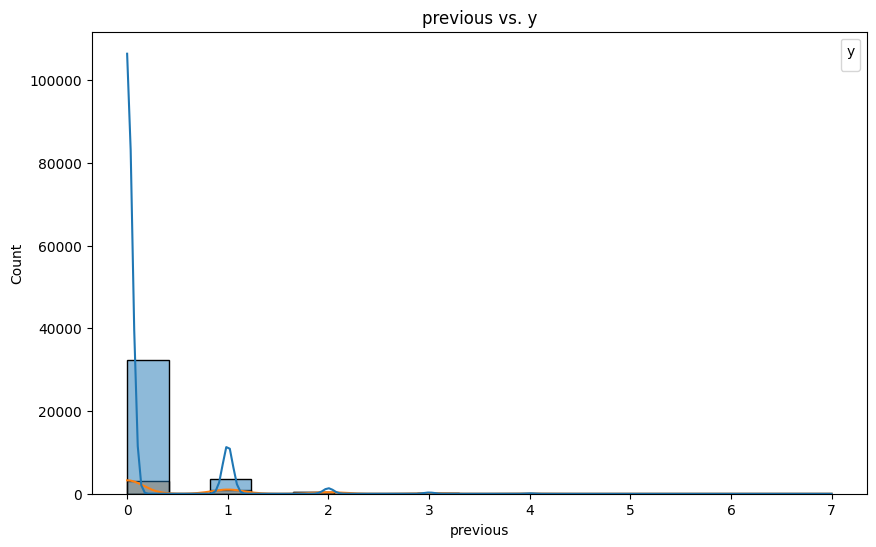

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


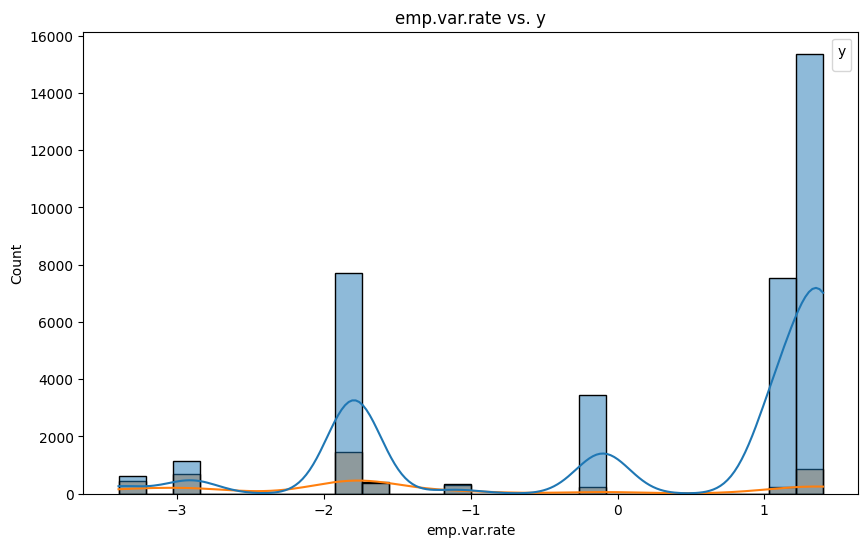

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


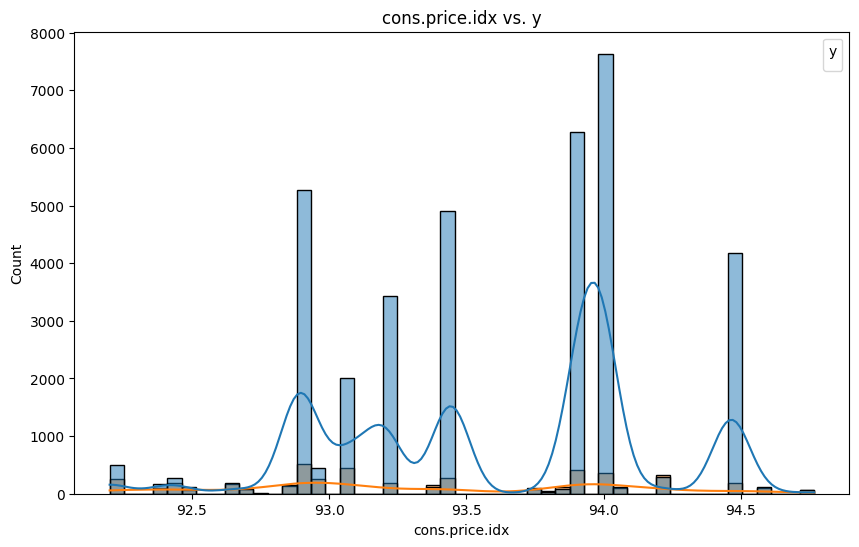

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


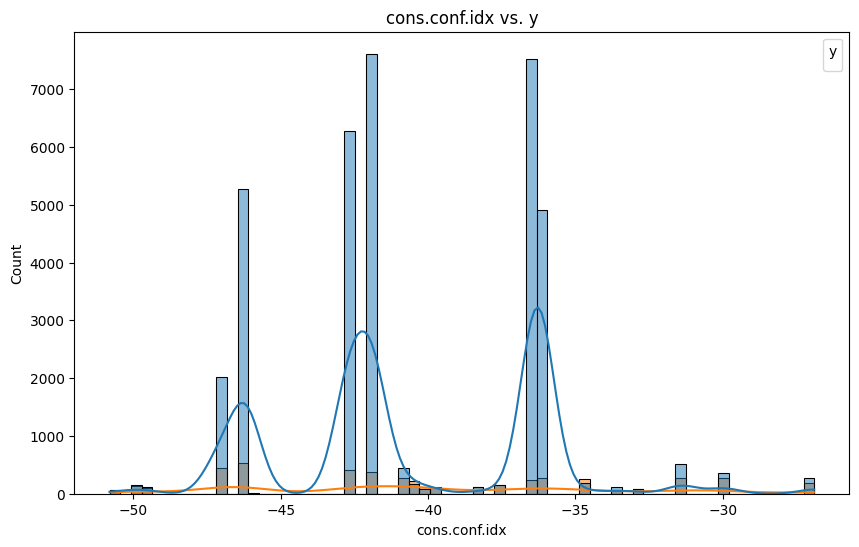

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


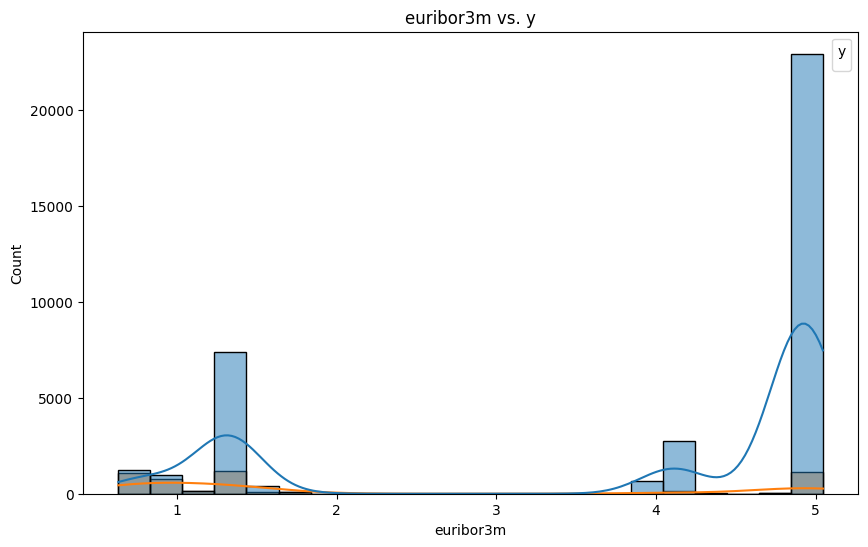

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


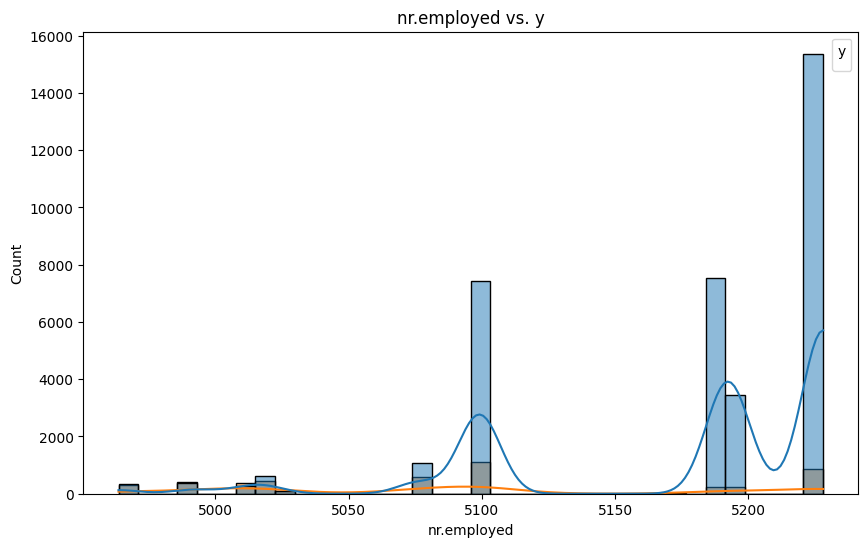

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# Gráfico de barras para variables categóricas
def plot_categorical(data, column):
    plt.figure(figsize=(10,6))
    sns.countplot(x=column, hue='y', data=data)
    plt.title(f'{column} vs. y')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='y', loc='upper right')
    plt.show()

# Gráfico de distribución para variables numéricas
def plot_numerical(data, column):
    plt.figure(figsize=(10,6))
    sns.histplot(data=data, x=column, hue='y', kde=True)
    plt.title(f'{column} vs. y')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.legend(title='y', loc='upper right')
    plt.show()

# Visualizar variables categóricas
categorical_columns = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome']
for column in categorical_columns:
    plot_categorical(data, column)

# Visualizar variables numéricas
numerical_columns = ['age', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']
for column in numerical_columns:
    plot_numerical(data, column)


Vemos campaign si quitamos los valores demasiado altos de campaign.

In [12]:
# Define el límite superior para eliminar las entradas con 'campaign' demasiado altos
campaign_upper_limit = 10 

print("Tamaño del DataFrame original:", data.shape)

# Filtrar el DataFrame para eliminar las entradas con 'campaign' demasiado altos
data_filtered = data[data['campaign'] <= campaign_upper_limit]

# Verificar el tamaño del DataFrame filtrado
print("Tamaño del DataFrame filtrado:", data_filtered.shape)

Tamaño del DataFrame original: (41188, 20)
Tamaño del DataFrame filtrado: (40319, 20)


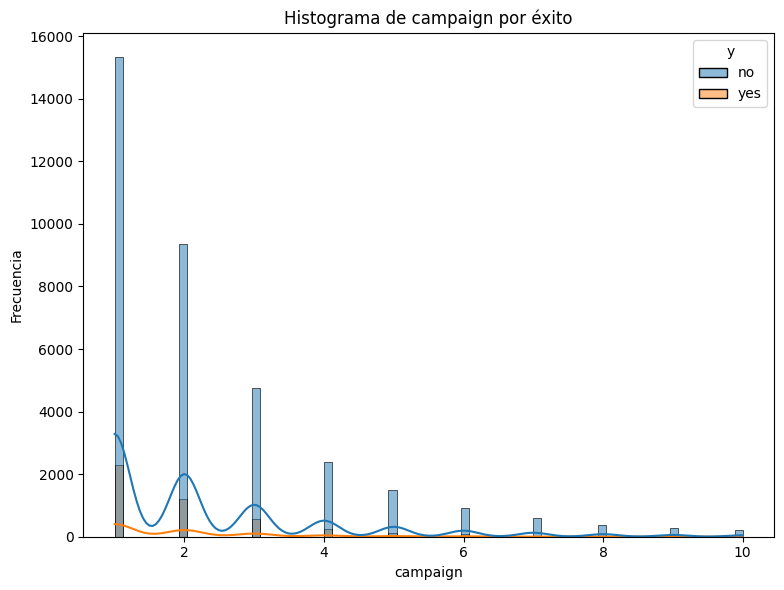

In [13]:
var='campaign'
plt.figure(figsize=(15, 6))
# Histograma
plt.subplot(1, 2, 2) # 1 fila, 2 columnas, segunda posición
sns.histplot(x=var, data=data_filtered, hue='y', kde=True)
plt.title('Histograma de '+var+' por éxito')
plt.xlabel(var)
plt.ylabel('Frecuencia')

plt.tight_layout() # Ajusta automáticamente la disposición de las subgráficas
plt.show()

Vemos previous si quitamos los valores demasiado altos.

In [14]:
# Define el límite superior para eliminar las entradas con 'campaign' demasiado altos
campaign_upper_limit = 3

print("Tamaño del DataFrame original:", data.shape)

# Filtrar el DataFrame para eliminar las entradas con 'campaign' demasiado altos
data_filtered = data[data['previous'] <= campaign_upper_limit]

# Verificar el tamaño del DataFrame filtrado
print("Tamaño del DataFrame filtrado:", data_filtered.shape)

Tamaño del DataFrame original: (41188, 20)
Tamaño del DataFrame filtrado: (41094, 20)


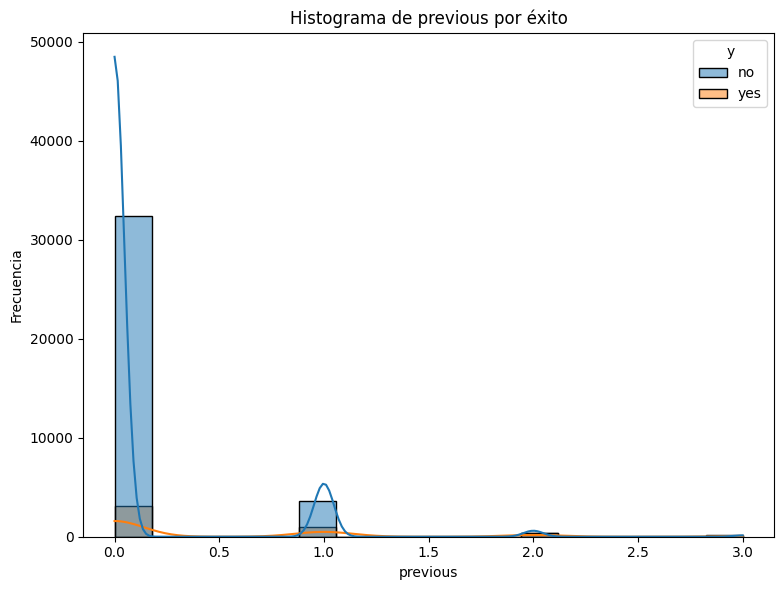

In [15]:
var='previous'
plt.figure(figsize=(15, 6))
# Histograma
plt.subplot(1, 2, 2) # 1 fila, 2 columnas, segunda posición
sns.histplot(x=var, data=data_filtered, hue='y', kde=True)
plt.title('Histograma de '+var+' por éxito')
plt.xlabel(var)
plt.ylabel('Frecuencia')

plt.tight_layout() # Ajusta automáticamente la disposición de las subgráficas
plt.show()

Hay variables categóricas con demasiadas clases, vamos a ver la proporción de trues en la variable predictora para simplificarlas.

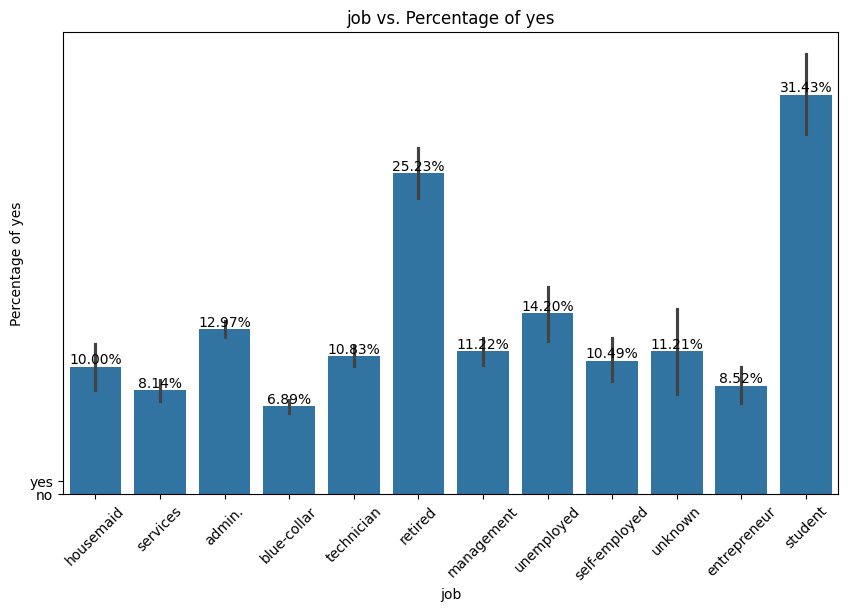

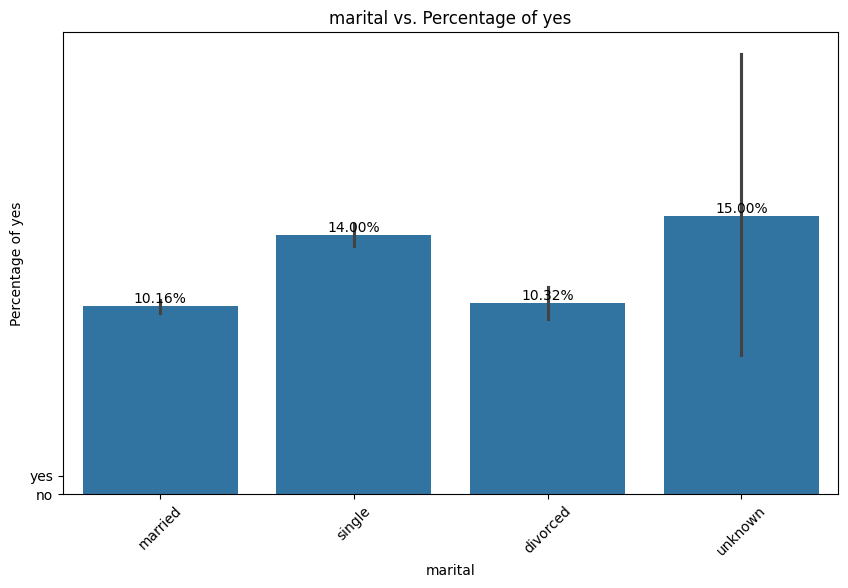

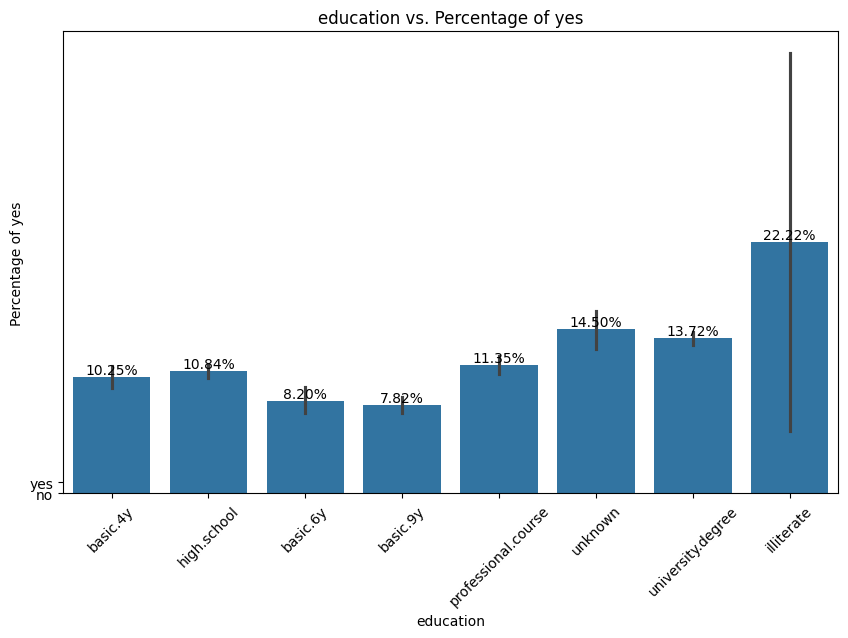

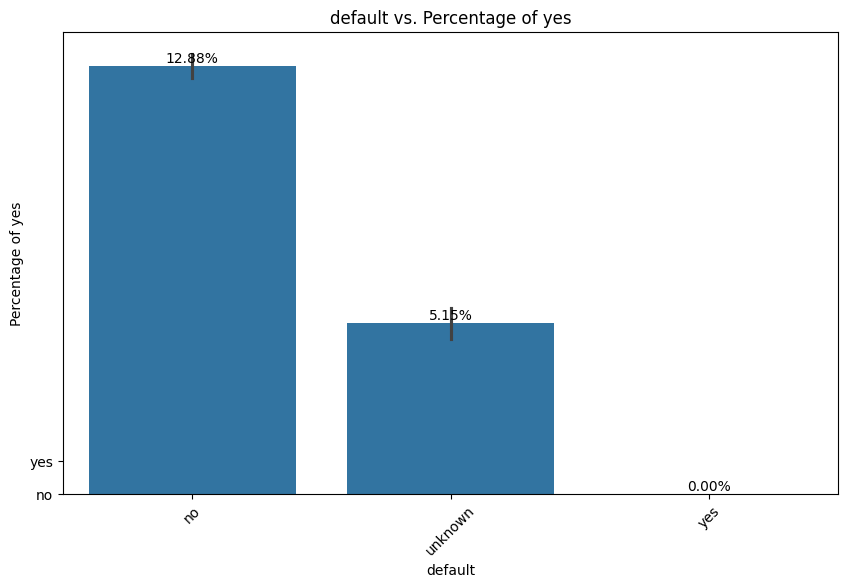

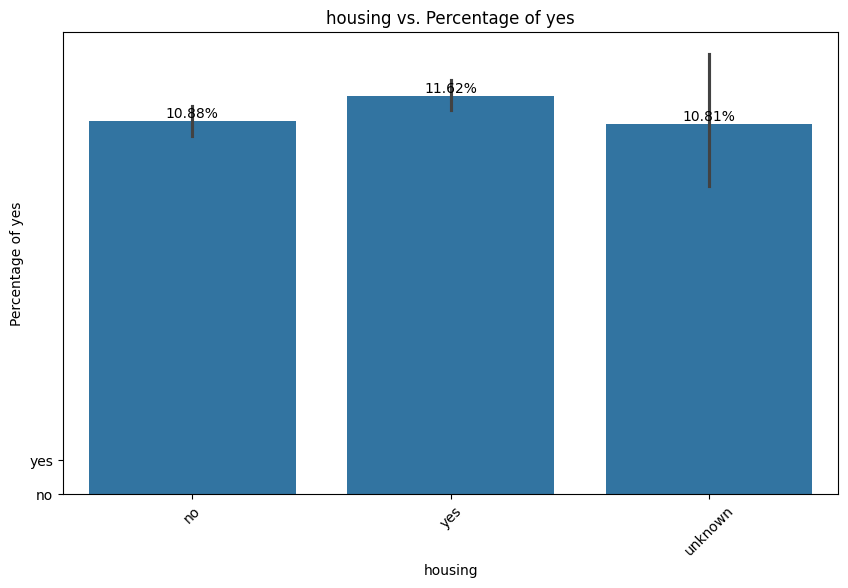

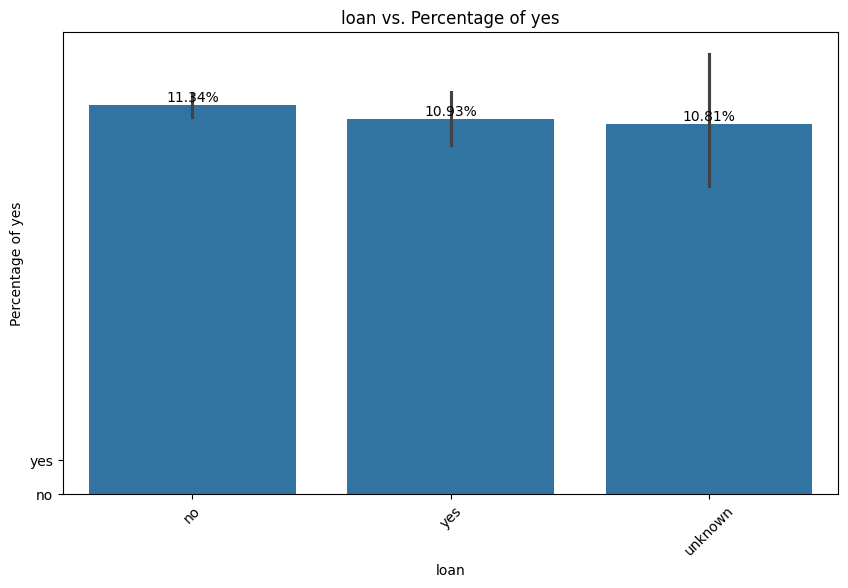

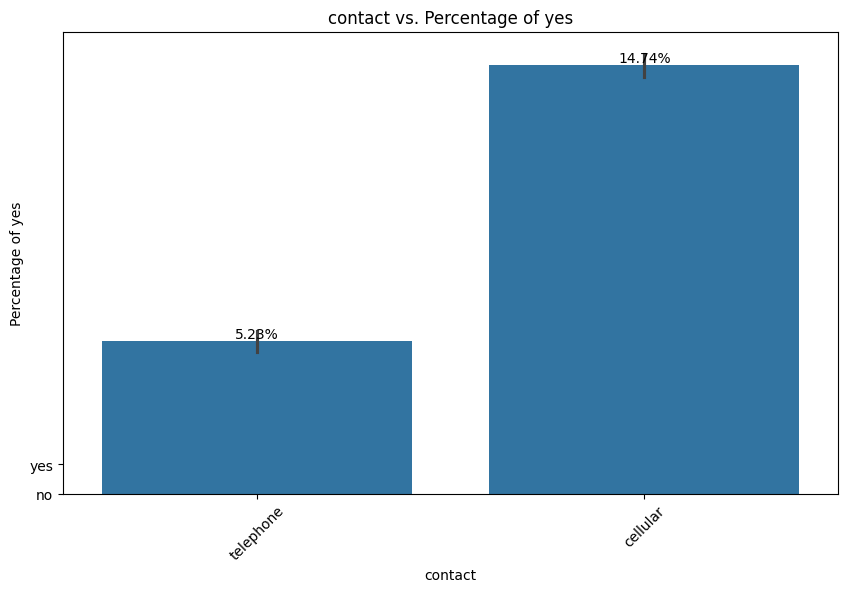

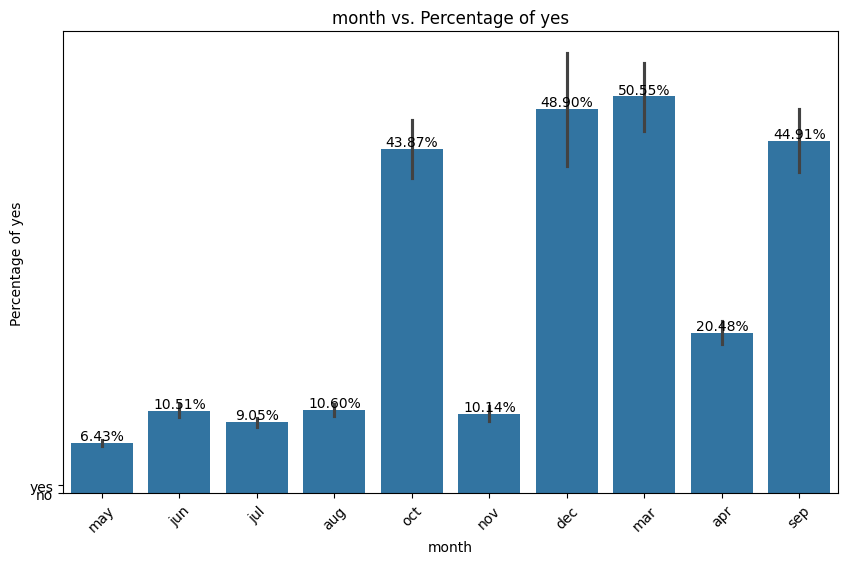

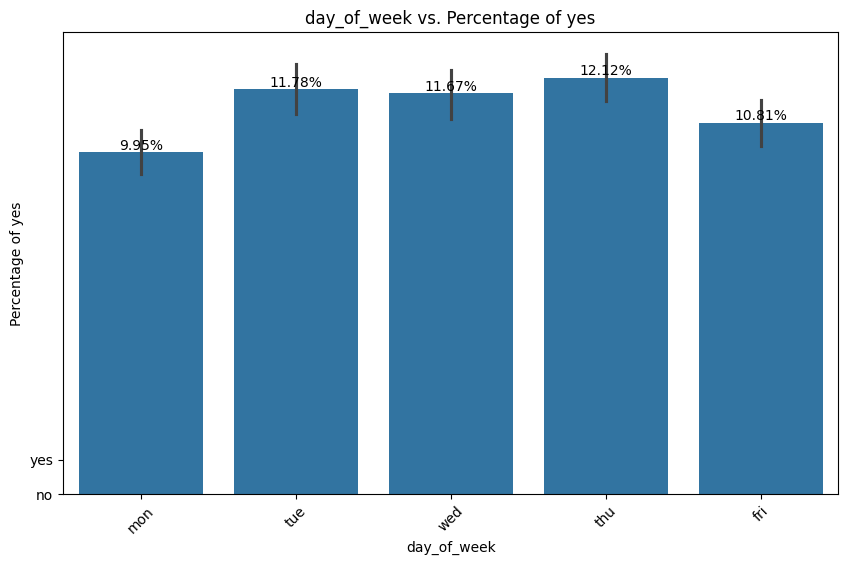

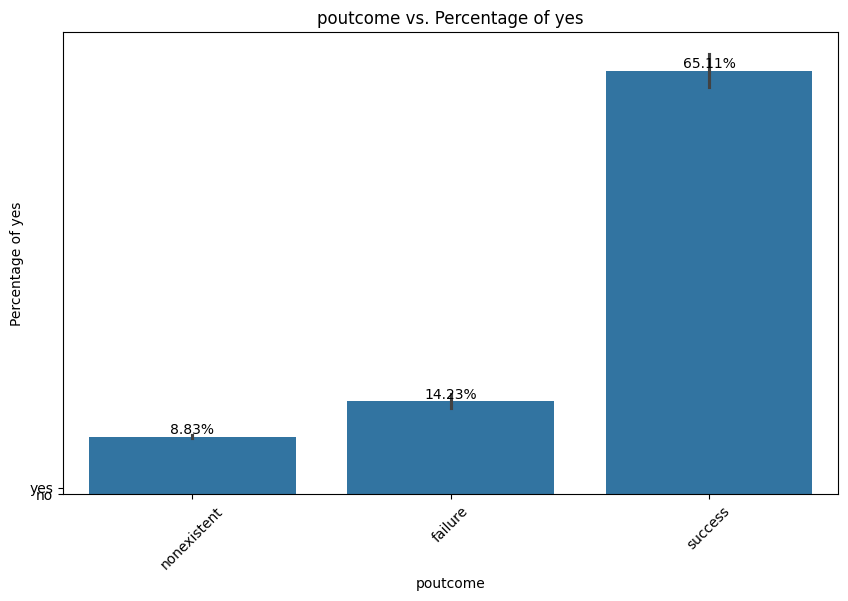

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Gráfico de barras para variables categóricas mostrando el porcentaje de 'yes' y valores numéricos
def plot_categorical_percentage(data, column):
    plt.figure(figsize=(10,6))
    sns.barplot(x=column, y='y', data=data, estimator=lambda x: sum(x==1)/len(x)*100)
    plt.title(f'{column} vs. Percentage of yes')
    plt.xlabel(column)
    plt.ylabel('Percentage of yes')
    plt.xticks(rotation=45)
    
    # Añadir valores numéricos en las barras
    ax = plt.gca()
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')
    
    plt.gca().invert_yaxis()  # Invertir el eje y para que los gráficos se muestren de abajo hacia arriba
    plt.show()

# Visualizar variables categóricas con porcentaje de 'yes' y valores numéricos
categorical_columns = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome']
for column in categorical_columns:
    plot_categorical_percentage(data, column)


Vamos a eliminar varibles que no aportan casi nada, las variables 'housing', 'loan' y 'day_of_week'.

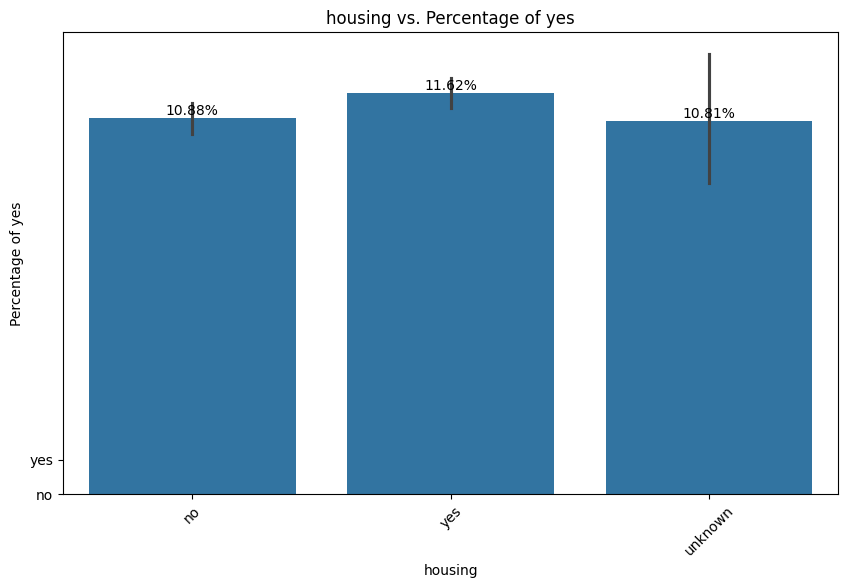

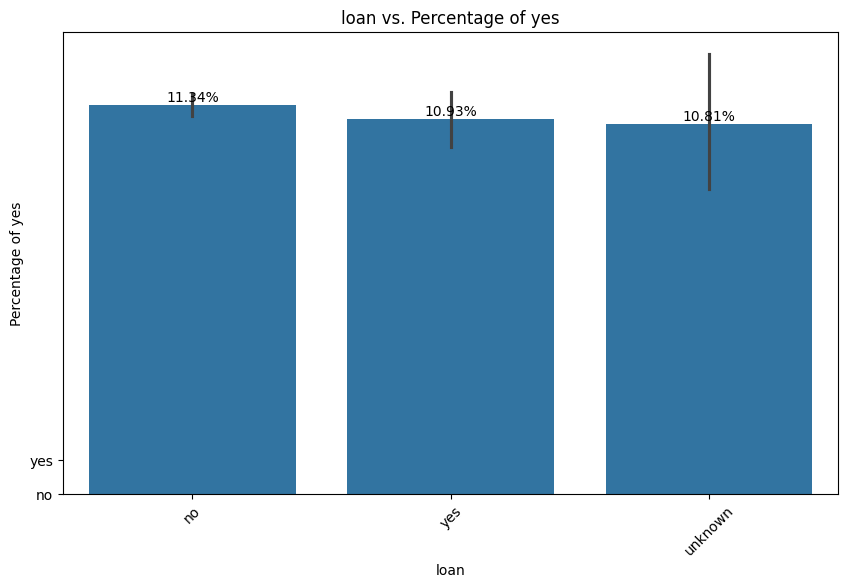

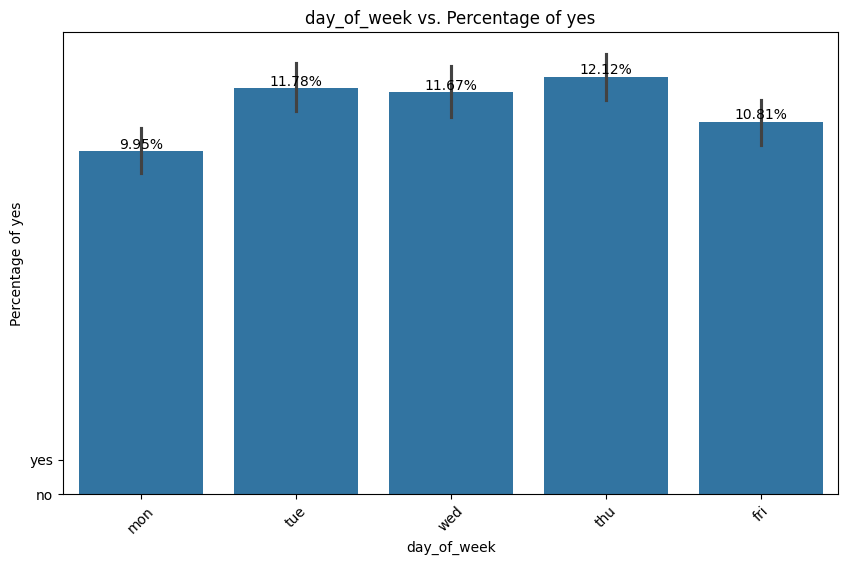

In [17]:
# Visualizar variables categóricas con porcentaje de 'yes' y valores numéricos
categorical_columns = ['housing', 'loan', 'day_of_week']
for column in categorical_columns:
    plot_categorical_percentage(data, column)

In [18]:
# Eliminar las variables housing, loan y day_of_week
data.drop(['housing', 'loan', 'day_of_week'], axis=1, inplace=True)

Agrupamos 'job' en dos categorías según la distribución.

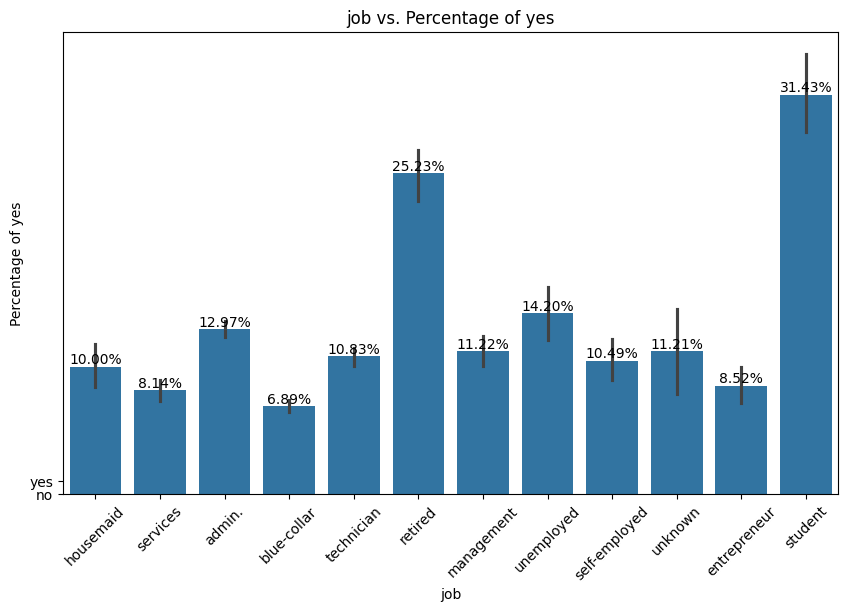

In [19]:
plot_categorical_percentage(data, 'job')

In [20]:
# Agrupar job
retired_student = ['retired', 'student']
data['job'] = data['job'].apply(lambda x: 'retired_student' if x in retired_student else 'not_retired_student')


Agrupamos 'marital' en dos categorías según la distribución.

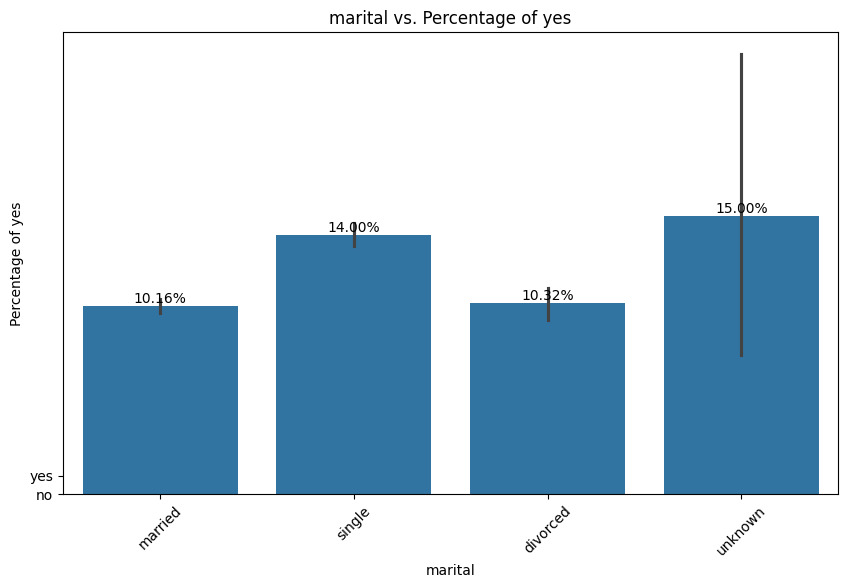

In [21]:
plot_categorical_percentage(data, 'marital')

In [22]:
# Agrupar marital
data['marital'] = data['marital'].apply(lambda x: 'married_divorced' if x in ['married', 'divorced'] else 'single_unknown')

Agrupamos 'education' en dos categorías según la distribución.

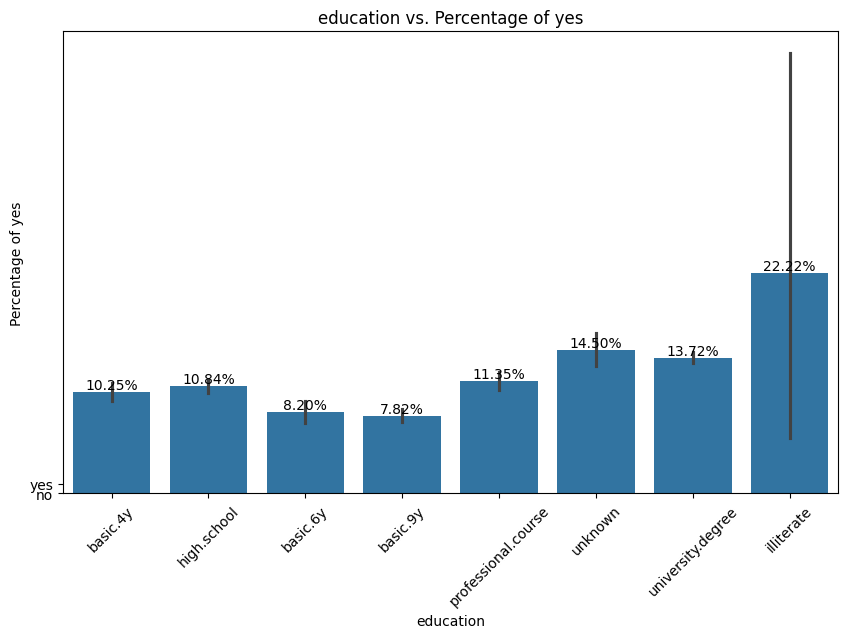

In [23]:
plot_categorical_percentage(data, 'education')

In [24]:
# Agrupar education
data['education'] = data['education'].apply(lambda x: 'no_education' if x == 'illiterate' else 'educated')

Agrupamos 'month' en dos categorías según la distribución.

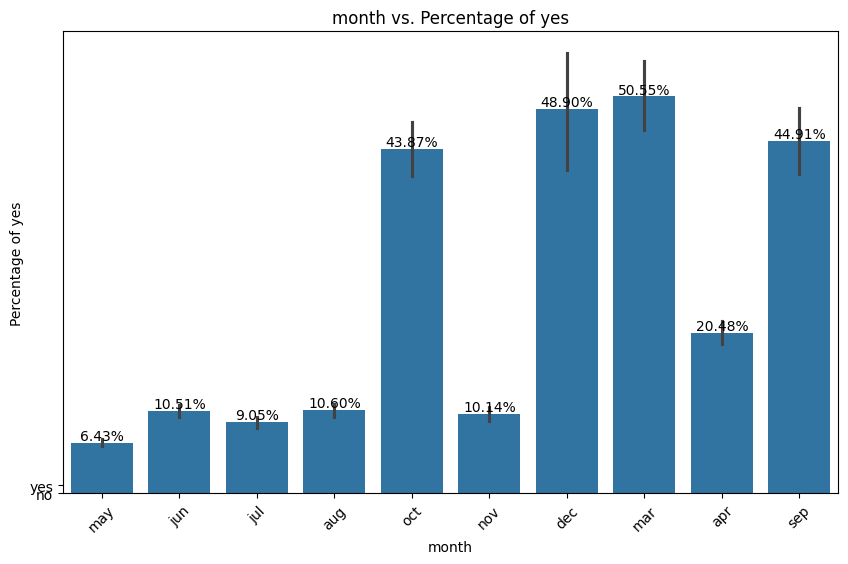

In [25]:
plot_categorical_percentage(data, 'month')

In [26]:
# Agrupar month
high_contact_months = ['oct', 'dec', 'mar', 'sep']
data['month'] = data['month'].apply(lambda x: 'high_contact_months' if x in high_contact_months else 'low_contact_months')

Finalmente:

In [27]:
data.head()

,age,job,marital,education,default,contact,month,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,not_retired_student,married_divorced,educated,no,telephone,low_contact_months,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,not_retired_student,married_divorced,educated,unknown,telephone,low_contact_months,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,not_retired_student,married_divorced,educated,no,telephone,low_contact_months,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,not_retired_student,married_divorced,educated,no,telephone,low_contact_months,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,not_retired_student,married_divorced,educated,no,telephone,low_contact_months,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [28]:
data.describe(include='all')

,age,job,marital,education,default,contact,month,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
count,41188.00000,41188,41188,41188,41188,41188,41188,41188.000000,41188.000000,41188.000000,41188,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188
unique,NaN,2,2,2,3,2,2,NaN,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,2
top,NaN,not_retired_student,married_divorced,educated,no,cellular,low_contact_months,NaN,NaN,NaN,nonexistent,NaN,NaN,NaN,NaN,NaN,no
freq,NaN,38593,29540,41170,32588,26144,39172,NaN,NaN,NaN,35563,NaN,NaN,NaN,NaN,NaN,36548
mean,40.02406,NaN,NaN,NaN,NaN,NaN,NaN,2.567593,962.475454,0.172963,NaN,0.081886,93.575664,-40.502600,3.621291,5167.035911,NaN
std,10.42125,NaN,NaN,NaN,NaN,NaN,NaN,2.770014,186.910907,0.494901,NaN,1.570960,0.578840,4.628198,1.734447,72.251528,NaN
min,17.00000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000,0.000000,NaN,-3.400000,92.201000,-50.800000,0.634000,4963.600000,NaN
25%,32.00000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,999.000000,0.000000,NaN,-1.800000,93.075000,-42.700000,1.344000,5099.100000,NaN
50%,38.00000,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,999.000000,0.000000,NaN,1.100000,93.749000,-41.800000,4.857000,5191.000000,NaN
75%,47.00000,NaN,NaN,NaN,NaN,NaN,NaN,3.000000,999.000000,0.000000,NaN,1.400000,93.994000,-36.400000,4.961000,5228.100000,NaN


### Correlación Pearson

Observamos la matriz de correlación de las variables numéricas.

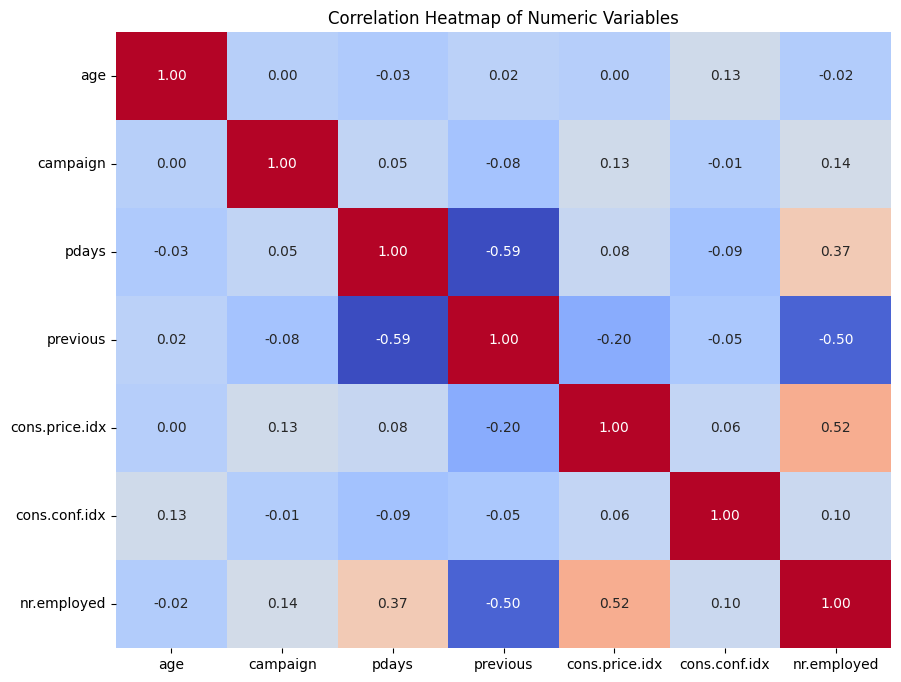

In [164]:
import matplotlib.pyplot as plt
import seaborn as sns

# Seleccionar solo las columnas numéricas
numeric_data = data.select_dtypes(include=['int64', 'float64'])

# Crear el mapa de calor de correlación
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_data.corr(method='pearson'),
            cmap='coolwarm',
            annot=True,
            fmt=".2f",
            annot_kws={'size': 10},
            cbar=False)
plt.title('Correlation Heatmap of Numeric Variables')
plt.show()

Vemos demasiada correlación entre algunas variables.

Eliminamos euribor3m.

In [30]:
# Eliminar la columna 'euribor3m'
data.drop(['euribor3m'], axis=1, inplace=True)

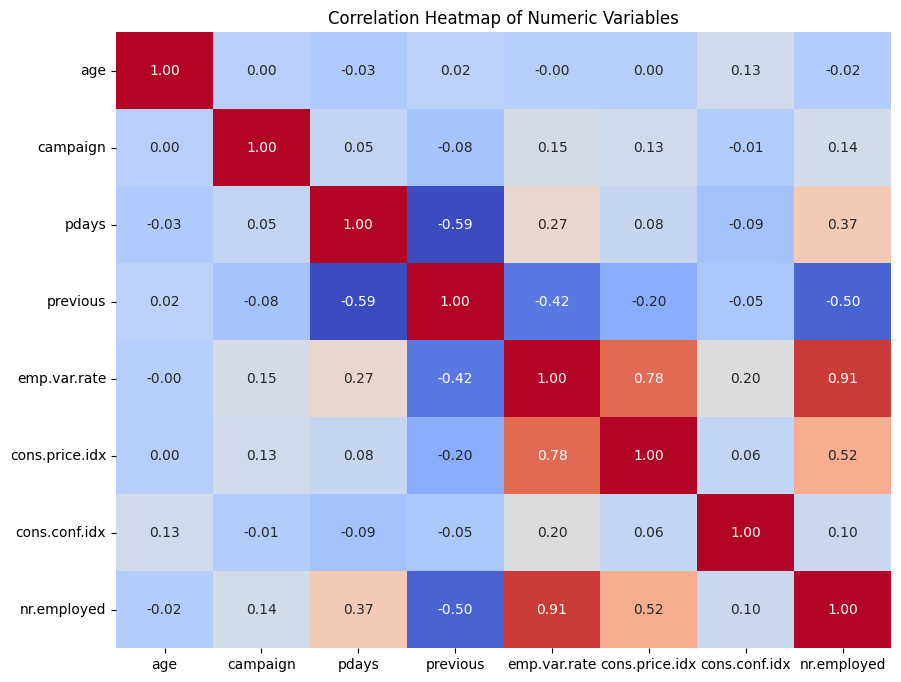

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

# Seleccionar solo las columnas numéricas
numeric_data = data.select_dtypes(include=['int64', 'float64'])

# Crear el mapa de calor de correlación
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_data.corr(method='pearson'),
            cmap='coolwarm',
            annot=True,
            fmt=".2f",
            annot_kws={'size': 10},
            cbar=False)
plt.title('Correlation Heatmap of Numeric Variables')
plt.show()

Eliminamos emp.var.rate.

In [32]:
# Eliminar la columna 'emp.var.rate'
data.drop(['emp.var.rate'], axis=1, inplace=True)

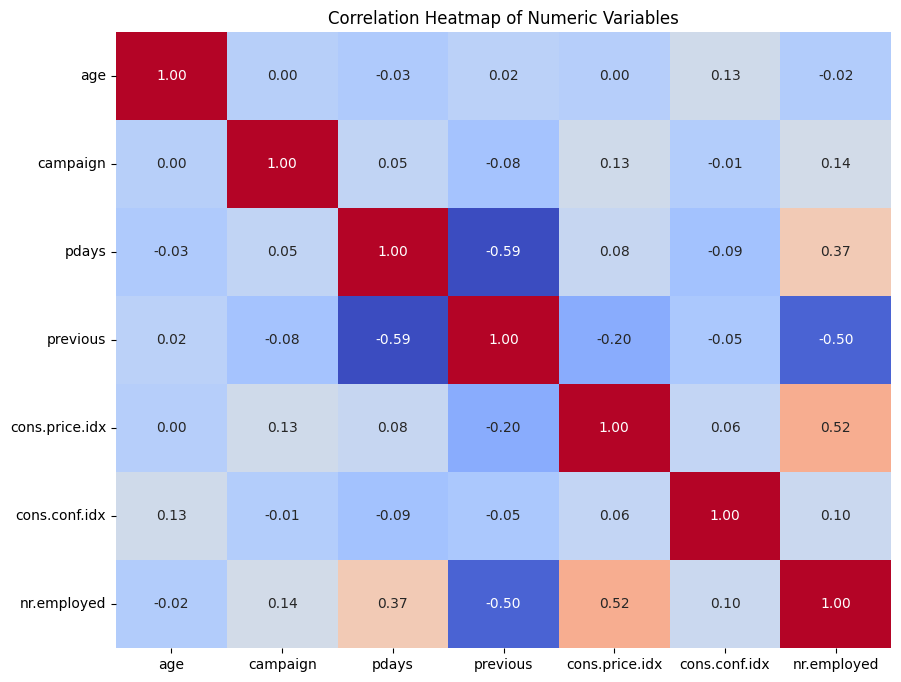

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

# Seleccionar solo las columnas numéricas
numeric_data = data.select_dtypes(include=['int64', 'float64'])

# Crear el mapa de calor de correlación
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_data.corr(method='pearson'),
            cmap='coolwarm',
            annot=True,
            fmt=".2f",
            annot_kws={'size': 10},
            cbar=False)
plt.title('Correlation Heatmap of Numeric Variables')
plt.show()

### Correlation Ratio

Observamos la correlación de las variables numéricas y categóricas.

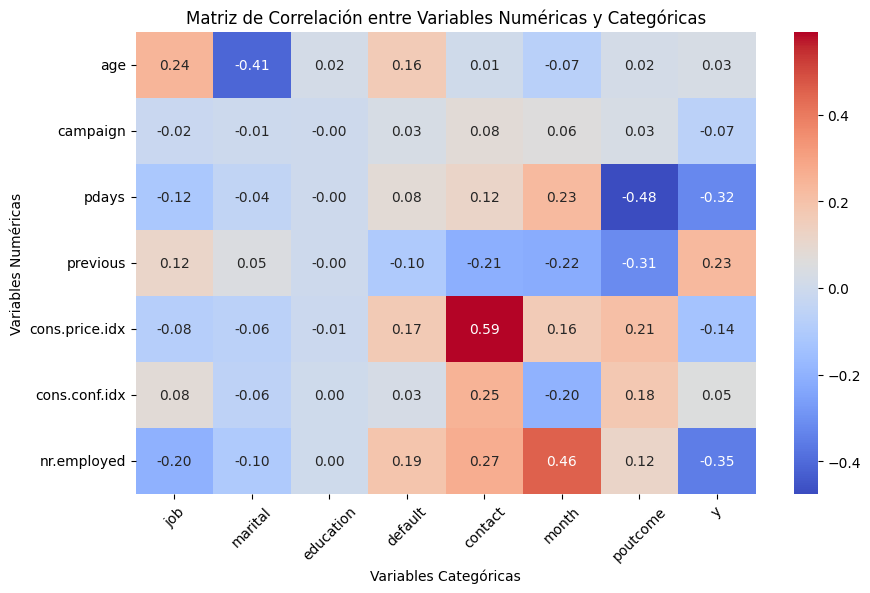

In [34]:
# Seleccionar variables numéricas y categóricas
numeric_data = data.select_dtypes(include=['int64', 'float64'])
categorical_data = data.select_dtypes(include=['object'])

# Copiar el dataframe para evitar modificar el original
data_df = data.copy()

# Convertir variables categóricas a numéricas utilizando LabelEncoder
le = preprocessing.LabelEncoder()
for categorical_column in categorical_data.columns:
    data_df[categorical_column] = le.fit_transform(data_df[categorical_column])

# Inicializar una matriz para almacenar los coeficientes de correlación
correlation_matrix = np.zeros((len(numeric_data.columns), len(categorical_data.columns)))

# Calcular correlation ratio entre variables numéricas y categóricas
for i, numeric_column in enumerate(numeric_data.columns):
    for j, categorical_column in enumerate(categorical_data.columns):
        correlation = stats.pointbiserialr(data_df[categorical_column], data_df[numeric_column])[0]
        correlation_matrix[i, j] = correlation

# Crear un DataFrame a partir de la matriz de correlación
correlation_df = pd.DataFrame(correlation_matrix, index=numeric_data.columns, columns=categorical_data.columns)

# Mostrar la matriz de correlación con colores
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_df, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={'size': 10})
plt.title('Matriz de Correlación entre Variables Numéricas y Categóricas')
plt.xlabel('Variables Categóricas')
plt.ylabel('Variables Numéricas')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

### Correlación Cramer

Observamos la matriz de correlación de las variables categóricas.

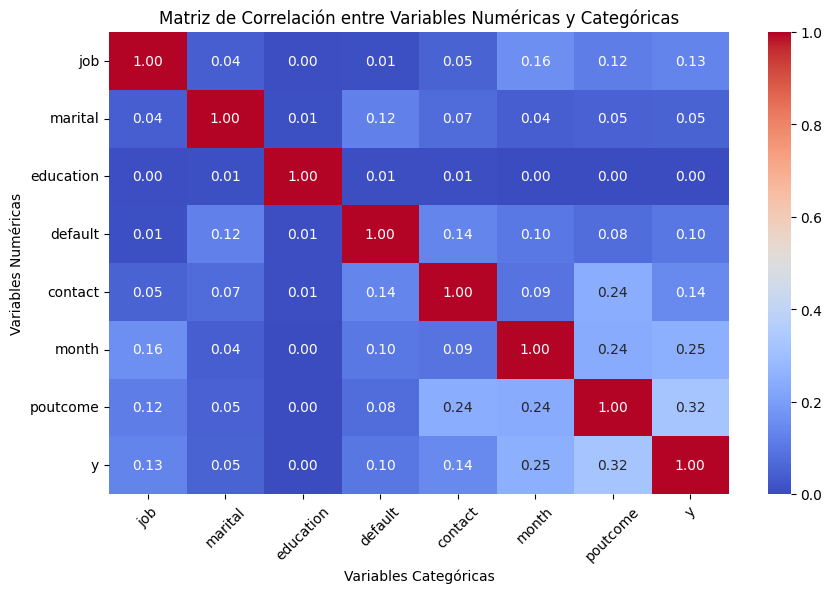

In [35]:
def cramers_v(confusion_matrix):
    """ Calculate Cramer's V statistic for categorical-categorical association.
        Uses correction from Bergsma and Wicher,
        Journal of the Korean Statistical Society 42 (2013): 323-328.
    """
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    rcorr = r - ((r - 1) ** 2) / (n - 1)
    kcorr = k - ((k - 1) ** 2) / (n - 1)
    return np.sqrt(phi2corr / min((kcorr - 1), (rcorr - 1)))

# Obtener las variables categóricas
categorical_columns = data.select_dtypes(include=['object']).columns

# Calcular el coeficiente de Cramer para todas las combinaciones de variables categóricas
cramer_matrix = np.zeros((len(categorical_columns), len(categorical_columns)))

for i, col1 in enumerate(categorical_columns):
    for j, col2 in enumerate(categorical_columns):
        if i == j:
            cramer_matrix[i, j] = 1.0
        else:
            confusion_matrix = pd.crosstab(data[col1], data[col2]).values
            cramer_matrix[i, j] = cramers_v(confusion_matrix)

# Crear un DataFrame a partir de la matriz de coeficientes de Cramer
cramer_df = pd.DataFrame(cramer_matrix, index=categorical_columns, columns=categorical_columns)

# Mostrar la matriz de correlación con colores
plt.figure(figsize=(10, 6))
sns.heatmap(cramer_df, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={'size': 10})
plt.title('Matriz de Correlación entre Variables Numéricas y Categóricas')
plt.xlabel('Variables Categóricas')
plt.ylabel('Variables Numéricas')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()

## Transformación de características

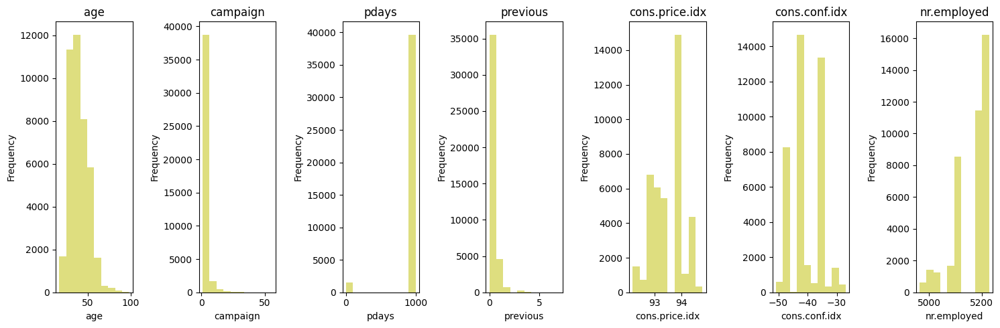

7 variables have been plotted


In [36]:
# Función para mostrar las gráficas
def hist_for_nums(data, numeric_cols):
    col_counter = 0
    data = data.copy()
    num_cols = len(numeric_cols)
    fig, axes = plt.subplots(1, num_cols, figsize=(15, 5))
    for i, col in enumerate(numeric_cols):
        data[col].plot.hist(alpha=0.5, color='y', ax=axes[i])
        axes[i].set_xlabel(col)
        axes[i].set_title(col)
        col_counter += 1
    plt.tight_layout()
    plt.show()
    print(col_counter, "variables have been plotted")

numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns
hist_for_nums(data, numeric_columns)

In [37]:
from sklearn.preprocessing import StandardScaler

# Seleccionar solo las columnas numéricas para escalar
numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns

# Escalar los datos
scaler = StandardScaler()
data[numeric_columns] = scaler.fit_transform(data[numeric_columns])

Normalizamos características numéricas para que tengan una escala común. Resulta útil si queremos comparar características.

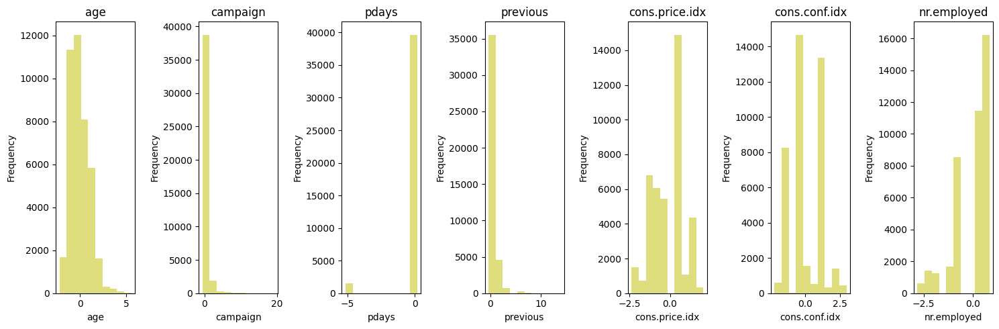

7 variables have been plotted


In [38]:
numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns
hist_for_nums(data, numeric_columns)

In [39]:
# Aplicar one-hot encoding a las variables categóricas
categorical_columns = data.select_dtypes(include=['object']).columns
data_encoded = pd.get_dummies(data, columns=categorical_columns , drop_first=True)

# Mostrar las primeras filas del nuevo conjunto de datos
data_encoded.head()

,age,campaign,pdays,previous,cons.price.idx,cons.conf.idx,nr.employed,job_retired_student,marital_single_unknown,education_no_education,default_unknown,default_yes,contact_telephone,month_low_contact_months,poutcome_nonexistent,poutcome_success,y_yes
0,1.533034,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.33168,False,False,False,False,False,True,True,True,False,False
1,1.628993,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.33168,False,False,False,True,False,True,True,True,False,False
2,-0.290186,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.33168,False,False,False,False,False,True,True,True,False,False
3,-0.002309,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.33168,False,False,False,False,False,True,True,True,False,False
4,1.533034,-0.565922,0.195414,-0.349494,0.722722,0.886447,0.33168,False,False,False,False,False,True,True,True,False,False


<Axes: >

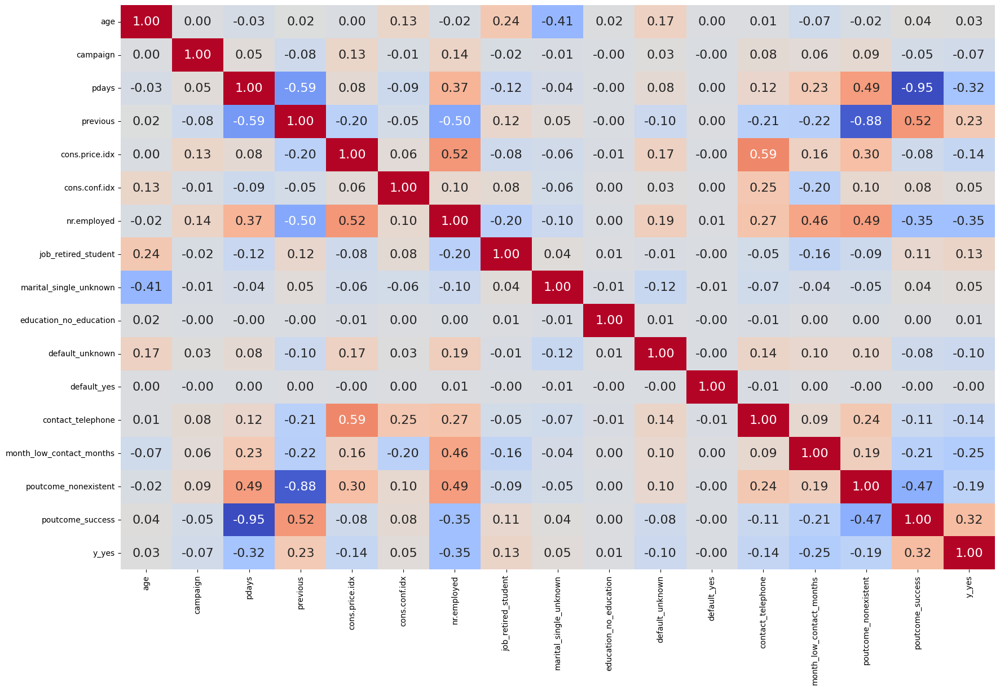

In [40]:
plt.figure(figsize=(20,13))
sns.heatmap(data_encoded.corr(),
            cmap='coolwarm',
            annot=True,
            fmt=".2f",
            annot_kws={'size':16},
            cbar=False)

Finalmente eliminamos previous.

In [41]:
data_encoded.drop(['previous'], axis=1, inplace=True)

Pasamos bools a ints.

In [ ]:
data_encoded.head()

,age,campaign,pdays,cons.price.idx,cons.conf.idx,nr.employed,job_retired_student,marital_single_unknown,education_no_education,default_unknown,default_yes,contact_telephone,month_low_contact_months,poutcome_nonexistent,poutcome_success,y_yes
0,1.533034,-0.565922,0.195414,0.722722,0.886447,0.33168,False,False,False,False,False,True,True,True,False,False
1,1.628993,-0.565922,0.195414,0.722722,0.886447,0.33168,False,False,False,True,False,True,True,True,False,False
2,-0.290186,-0.565922,0.195414,0.722722,0.886447,0.33168,False,False,False,False,False,True,True,True,False,False
3,-0.002309,-0.565922,0.195414,0.722722,0.886447,0.33168,False,False,False,False,False,True,True,True,False,False
4,1.533034,-0.565922,0.195414,0.722722,0.886447,0.33168,False,False,False,False,False,True,True,True,False,False


In [ ]:
data_encoded.keys()

Index(['age', 'campaign', 'pdays', 'cons.price.idx', 'cons.conf.idx',
       'nr.employed', 'job_retired_student', 'marital_single_unknown',
       'education_no_education', 'default_unknown', 'default_yes',
       'contact_telephone', 'month_low_contact_months', 'poutcome_nonexistent',
       'poutcome_success', 'y_yes'],
      dtype='object')

In [ ]:
# Convertir columnas de booleanos a enteros
bool_columns = ['job_retired_student', 'marital_single_unknown', 'education_no_education', 'default_unknown', 'default_yes', 'contact_telephone', 'month_low_contact_months', 'poutcome_nonexistent', 'poutcome_success', 'y_yes']

for col in bool_columns:
    data_encoded[col] = data_encoded[col].astype(int)

# Guardamos los datos
Guardo los datos en un fichero para entrenar los modelos directamente en python.

In [47]:
nombre_archivo = "../../BankMarketing/BankMarketingPrepared.csv"

# Guardar los datos preparados en un archivo CSV
data_encoded.to_csv(nombre_archivo, index=False)

# Interpretación Naive

La interpretación general es especialmente difícil pues hay bastante características que cuesta mucho ver. Además, el desbalanceo de las clases no ayuda. Tenemos demasiadas variables y casi todas con distribuciones muy similares para los diferentes valores.

Lo poco que puedo comentar es que:
- A partir de cierta edad (en torno a 30 años) empieza a ser más probable aceptar cuanta más edad se tiene.
- Hay meses con más cantidad de subscripciones.
- Es más probable subscribirse si la llamada se realiza con el celular en vez del teléfono.
- La gente sin estudios es más propensa a subscribirse.
- Los jubilados y estudiantes son más propensos a subscribirse.

# Entrenamiento de modelos de clasificación

In [48]:
import random
import Modelos
import pandas as pd
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

import Modelos

random.seed(6)

import sys
sys.path.append('../../')

In [49]:
nombre_archivo = "../../BankMarketing/BankMarketingPrepared.csv"

datos_leidos = pd.read_csv(nombre_archivo)

In [50]:
# Dividir los datos en características (X) y etiquetas (y)
X = datos_leidos.drop('y_yes', axis=1)  # Características
y = datos_leidos['y_yes']  # Etiquetas

# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

**Reporte de clasificación (Classification Report) por clases**:

**Precision (Precisión)**: Es la proporción de verdaderos positivos sobre el total de predicciones positivas hechas por el modelo.

**Recall (Recuperación o Sensibilidad)**: Es la proporción de verdaderos positivos sobre el total de casos positivos reales en el conjunto de datos.

**F1-score**: Es una medida que combina tanto la precisión como el recall en una sola métrica. Es útil cuando hay un desequilibrio entre las clases. Un F1-score alto indica un buen equilibrio entre precisión y recall.

**Support**: Es el número de muestras reales en cada clase en el conjunto de datos de prueba.

**Macro avg y weighted avg**: Son promedios de las métricas de precision, recall y f1-score, calculados de diferentes maneras. Macro avg calcula el promedio no ponderado de las métricas para todas las clases. Weighted avg calcula el promedio ponderado por el número de muestras en cada clase. En este caso, el macro avg y weighted avg para precision, recall y f1-score son similares debido a un equilibrio relativamente uniforme entre las clases.

## Regresión Logística

In [51]:
rg_lg = Modelos.resultados_regresion_logistica(X_train, y_train, X_test, y_test)


Regresión Logística:

Regresión Logística en conjunto de test:
Precisión: 0.898154891964069
Reporte de clasificación:
              precision    recall  f1-score   support

           0       0.91      0.99      0.94      7303
           1       0.65      0.22      0.33       935

    accuracy                           0.90      8238
   macro avg       0.78      0.60      0.64      8238
weighted avg       0.88      0.90      0.87      8238



In [57]:
# Serialize the object to a binary format
with open('rg_lg.pkl', 'wb') as file:
    pickle.dump(rg_lg, file)

## Árbol de Decisión

Primero con buscamos en todo un grid para tener una estimación de los mejores hiperparámetros.

In [52]:


param_grid = {
    "learning_rate": [0.01, 0.1],
    "n_estimators": [50, 100, 150, 200],
    "max_depth": [3, 5, 10],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [2, 4],
    'subsample': [0.8]
}

# Inicializar el clasificador GradientBoosting
gb_clf = GradientBoostingClassifier()

best_params = Modelos.optimizar_modelo_clasificacion("DecisionTree", gb_clf, param_grid, X_train, y_train, X_test, y_test)


DecisionTree:
Fitting 5 folds for each of 96 candidates, totalling 480 fits
Mejores hiperparámetros encontrados:
{'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100, 'subsample': 0.8}

Precisión del modelo en el conjunto de test: 0.8964554503520272
Reporte de clasificación en el conjunto de test:
              precision    recall  f1-score   support

           0       0.91      0.98      0.94      7303
           1       0.62      0.23      0.34       935

    accuracy                           0.90      8238
   macro avg       0.76      0.61      0.64      8238
weighted avg       0.88      0.90      0.88      8238



In [59]:
gb_clf = GradientBoostingClassifier(learning_rate=0.01,
                                     max_depth=3,
                                     min_samples_leaf=4,
                                     min_samples_split=2,
                                     n_estimators=100,
                                     subsample=0.8)
gb_clf.fit(X_train, y_train)

# Serialize the object to a binary format
with open('gb_clf.pkl', 'wb') as file:
    pickle.dump(gb_clf, file)

## Random Forest

In [60]:
param_grid = {
    'n_estimators': [50, 100, 150, 200],
    'max_features': ['log2', 'sqrt', None],
    'max_depth': [None, 5, 10, 30],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [2, 4],
    'bootstrap': [True]
}

# Inicializar el clasificador Random Forest
rf_clf = RandomForestClassifier()
rf_clf = Modelos.optimizar_modelo_clasificacion_randomized("RandomForest", rf_clf, param_grid, X_train, y_train, X_test, y_test)


RandomForest:
Fitting 5 folds for each of 100 candidates, totalling 500 fits
Mejores hiperparámetros encontrados:
{'n_estimators': 150, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': 5, 'bootstrap': True}

Precisión del modelo en el conjunto de test: 0.8962126729788784


In [61]:
rf_clf = RandomForestClassifier(n_estimators=150, min_samples_split=5, min_samples_leaf=2, max_features=None, max_depth=5, bootstrap=True)
rf_clf.fit(X_train, y_train)

# Serialize the object to a binary format
with open('rf_clf.pkl', 'wb') as file:
    pickle.dump(rf_clf, file)

### Red neuronal

Debido a que los resultados son parecidos y es mucho más sencillo, trabajo con la segunda opción de MLPClassifier de Sklearn.

#### Opción Keras

In [54]:
import pandas as pd
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense


nombre_archivo = "../../BankMarketing/BankMarketingPrepared.csv"
datos_leidos = pd.read_csv(nombre_archivo)

# Dividir los datos en características (X) y etiquetas (y)
X = datos_leidos.drop('y_yes', axis=1)  # Características
y = datos_leidos['y_yes']  # Etiquetas

# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Crear el modelo de red neuronal
modelo = Sequential()
modelo.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))  # Capa oculta con 64 neuronas y función de activación ReLU
modelo.add(Dense(32, activation='relu'))  # Nueva capa oculta con 32 neuronas y función de activación ReLU
modelo.add(Dense(1, activation='sigmoid'))  # Capa de salida con 1 neurona y función de activación sigmoide

# Compilar el modelo
modelo.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Entrenar el modelo
modelo.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

# Evaluar el modelo
puntuacion = modelo.evaluate(X_test, y_test)
print("Precisión del modelo: %.2f%%" % (puntuacion[1] * 100))

nt_clf=modelo

2024-05-12 10:46:34.003235: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-05-12 10:46:34.858353: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2024-05-12 10:46:34.863764: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-12 10:46:36.283098: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Epoch 1/10
1030/1030 [==============================] - 2s 1ms/step - loss: 0.2931 - accuracy: 0.8952 - val_loss: 0.2870 - val_accuracy: 0.8971
Epoch 2/10
1030/1030 [==============================] - 1s 1ms/step - loss: 0.2761 - accuracy: 0.9003 - val_loss: 0.2856 - val_accuracy: 0.8973
Epoch 3/10
1030/1030 [==============================] - 1s 1ms/step - loss: 0.2736 - accuracy: 0.9009 - val_loss: 0.2845 - val_accuracy: 0.8958
Epoch 4/10
1030/1030 [==============================] - 1s 1ms/step - loss: 0.2734 - accuracy: 0.9020 - val_loss: 0.2849 - val_accuracy: 0.8966
Epoch 5/10
1030/1030 [==============================] - 1s 1ms/step - loss: 0.2725 - accuracy: 0.9013 - val_loss: 0.2851 - val_accuracy: 0.8952
Epoch 6/10
1030/1030 [==============================] - 1s 1ms/step - loss: 0.2716 - accuracy: 0.9025 - val_loss: 0.2838 - val_accuracy: 0.8961
Epoch 7/10
1030/1030 [==============================] - 1s 1ms/step - loss: 0.2711 - accuracy: 0.9021 - val_loss: 0.2840 - val_accuracy:

In [58]:
# Serialize the object to a binary format
with open('nt_clf.pkl', 'wb') as file:
    pickle.dump(nt_clf, file)

#### Opción MLP Sklearn

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier

# Cargar los datos
nombre_archivo = "../../BankMarketing/BankMarketingPrepared.csv"
datos_leidos = pd.read_csv(nombre_archivo)

# Dividir los datos en características (X) y etiquetas (y)
X = datos_leidos.drop('y_yes', axis=1)  # Características
y = datos_leidos['y_yes']  # Etiquetas

# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Crear y entrenar el modelo MLPClassifier
mlp_clf = MLPClassifier(hidden_layer_sizes=(64, 32), activation='relu', solver='adam', max_iter=10, random_state=42)
mlp_clf.fit(X_train, y_train)

# Evaluar el modelo
accuracy = mlp_clf.score(X_test, y_test)
print("Precisión del modelo: %.2f%%" % (accuracy * 100))


Precisión del modelo: 89.61%


/home/gregorio/.local/lib/python3.8/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (10) reached and the optimization hasn't converged yet.
  warnings.warn(


In [102]:
# Serialize the object to a binary format
with open('mlp_clf.pkl', 'wb') as file:
    pickle.dump(mlp_clf, file)

### Modelos obtenidos

GUARDAR Y CARGAR CON PICKLE

In [103]:
# Imports necesarios
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

import random
random.seed(6)

nombre_archivo = "../../BankMarketing/BankMarketingPrepared.csv"
datos_leidos = pd.read_csv(nombre_archivo)

# Dividir los datos en características (X) y etiquetas (y)
X = datos_leidos.drop('y_yes', axis=1)  # Características
y = datos_leidos['y_yes']  # Etiquetas

# Dividir los datos en conjunto de entrenamiento y conjunto de prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

with open('rg_lg.pkl', 'rb') as file:
    rg_lg = pickle.load(file)
with open('gb_clf.pkl', 'rb') as file:
    gb_clf = pickle.load(file)
with open('rf_clf.pkl', 'rb') as file:
    rf_clf = pickle.load(file)
with open('mlp_clf.pkl', 'rb') as file:
    mlp_clf = pickle.load(file)

print('Preparado')

Preparado


## Optimizar Umbrales

In [65]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import Umbrales

### Regresión Logística

In [66]:
clf=rg_lg

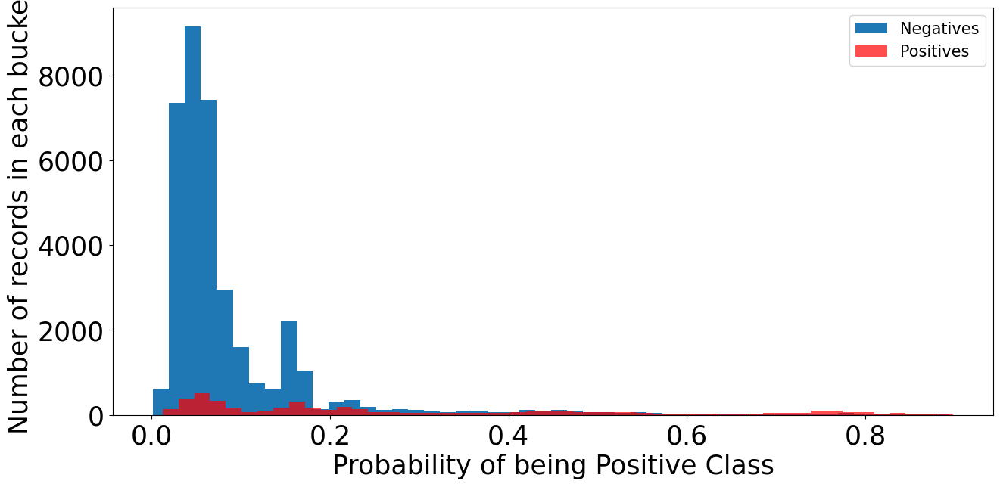

In [67]:
Umbrales.plot_prob(clf, X, y)


Precisión con umbral nuevo: 0.8757647858599592
Informe de clasificación con umbral nuevo:
              precision    recall  f1-score   support

           0       0.94      0.92      0.93     36548
           1       0.45      0.50      0.48      4640

    accuracy                           0.88     41188
   macro avg       0.69      0.71      0.70     41188
weighted avg       0.88      0.88      0.88     41188



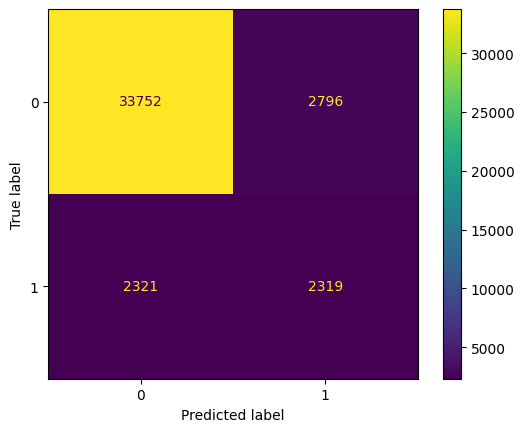

In [71]:
Umbrales.report_umbral(0.19, clf, X, y)

### Árbol de Decisión

In [72]:
clf=gb_clf

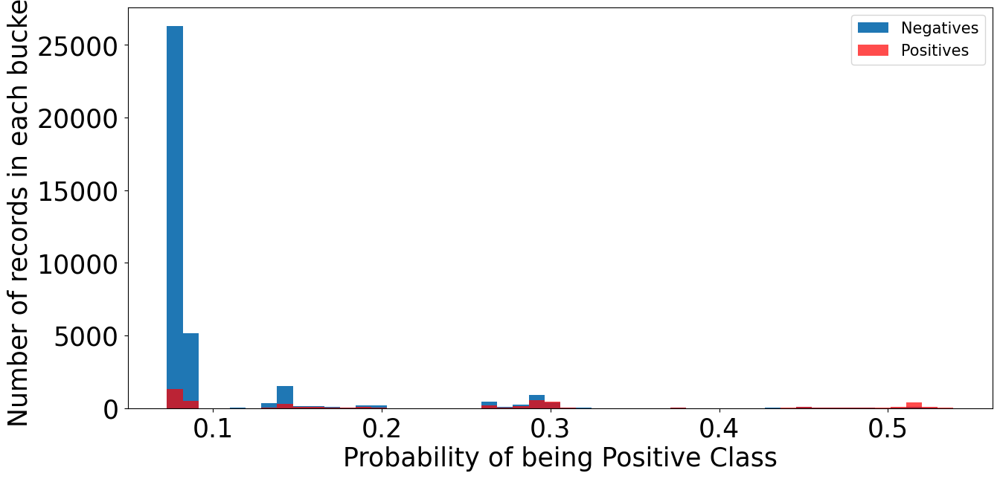

In [73]:
Umbrales.plot_prob(clf, X, y)


Precisión con umbral nuevo: 0.8332766825288919
Informe de clasificación con umbral nuevo:
              precision    recall  f1-score   support

           0       0.95      0.86      0.90     36548
           1       0.36      0.62      0.46      4640

    accuracy                           0.83     41188
   macro avg       0.65      0.74      0.68     41188
weighted avg       0.88      0.83      0.85     41188



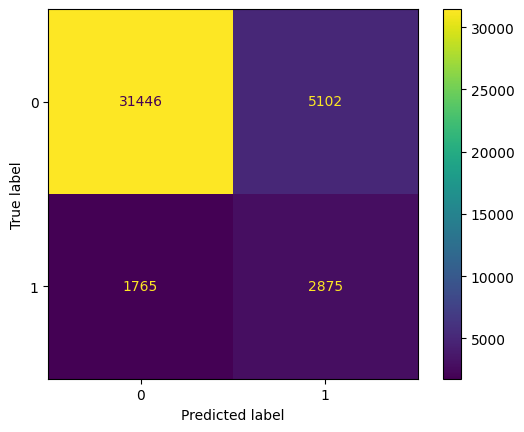

In [74]:
Umbrales.report_umbral(0.1, clf, X, y)

### Random Forest

In [75]:
clf=rf_clf

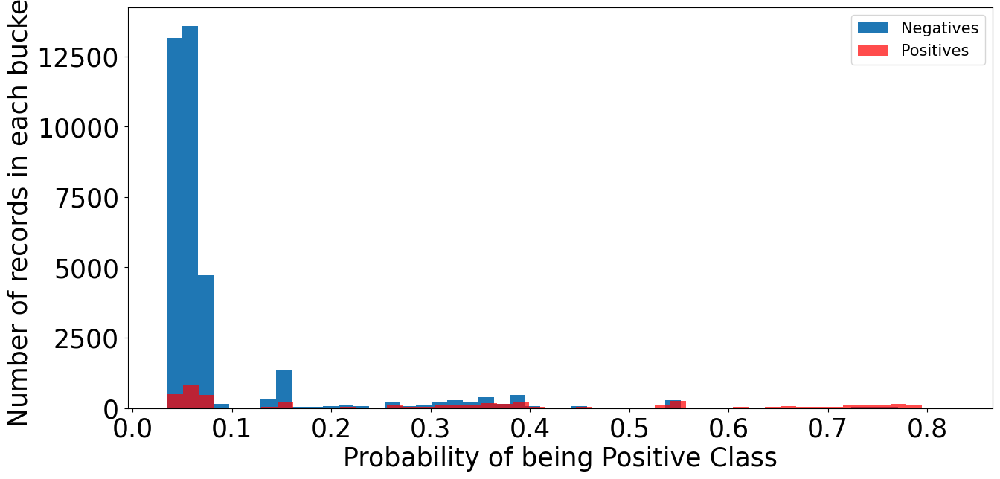

In [76]:
Umbrales.plot_prob(clf, X, y)


Precisión con umbral nuevo: 0.9025201515004371
Informe de clasificación con umbral nuevo:
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     36548
           1       0.64      0.31      0.42      4640

    accuracy                           0.90     41188
   macro avg       0.78      0.64      0.68     41188
weighted avg       0.89      0.90      0.89     41188



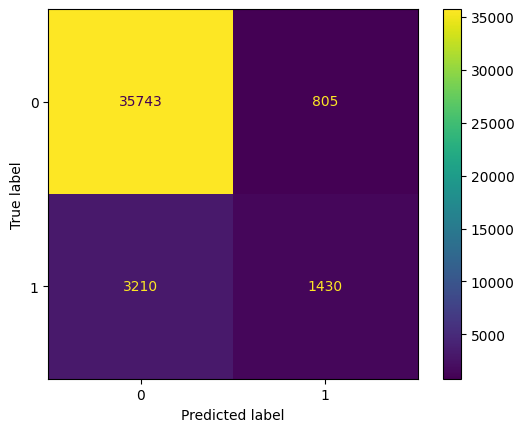

In [77]:
Umbrales.report_umbral(0.4, clf, X, y)

### Red Neuronal

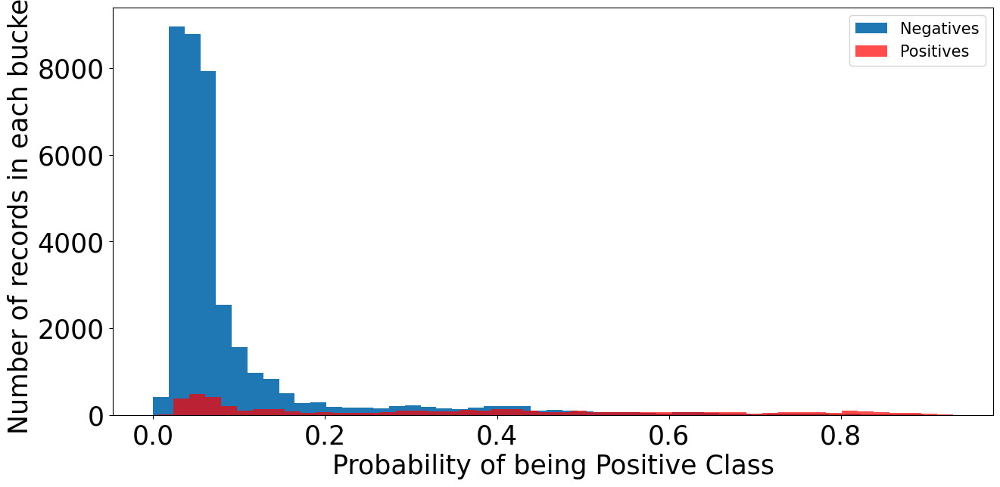

In [104]:
Umbrales.plot_prob(mlp_clf, X, y)


Precisión con umbral nuevo: 0.9007477906186268
Informe de clasificación con umbral nuevo:
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     36548
           1       0.62      0.32      0.42      4640

    accuracy                           0.90     41188
   macro avg       0.77      0.65      0.68     41188
weighted avg       0.88      0.90      0.89     41188



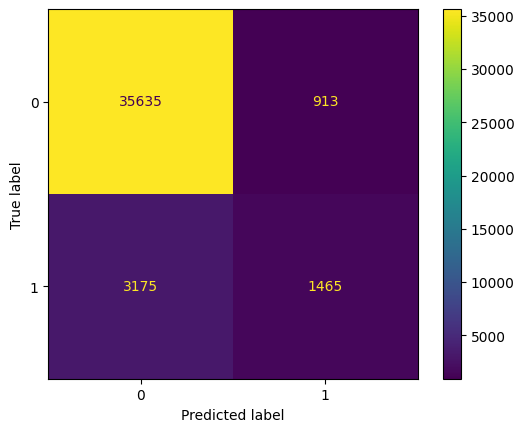

In [105]:
Umbrales.report_umbral(0.47, mlp_clf, X, y)

# Comparar Resultados

Viendo las matrices de confusión (f1-score) y las distribuciones de las probabilidades de ser positivo parece claro que random forest y redes neuronales predicen un poco mejor.

# Interpretabilidad

Vamos primero a comparar Permutation Feature Importance.

In [83]:
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
from sklearn.inspection import permutation_importance

## PFI

### Regresión Logística

In [84]:
r = permutation_importance(rg_lg, X, y,
                            n_repeats=30,
                            random_state=0)

Text(0.5, 1.0, 'Permutation Importance')

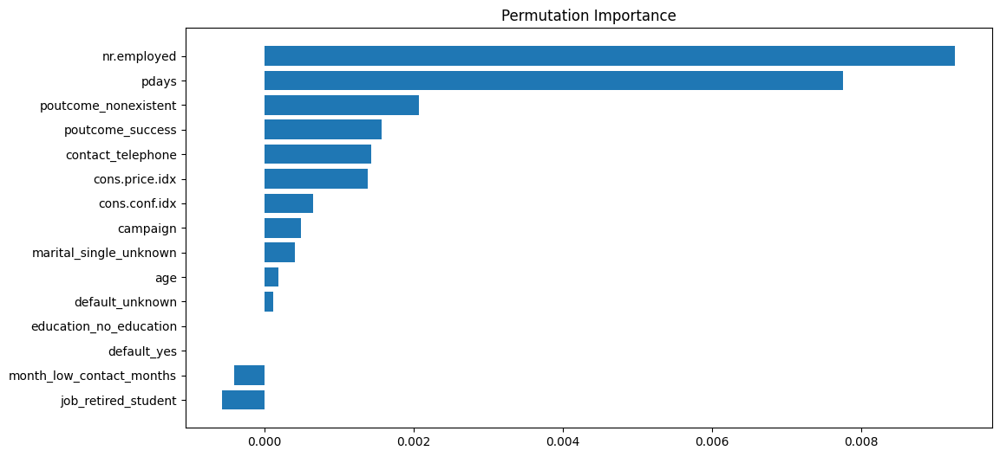

In [85]:
sorted_idx = r.importances_mean.argsort()
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), r.importances_mean[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X.columns)[sorted_idx])
plt.title('Permutation Importance')

### Random Forest

In [86]:
r = permutation_importance(rf_clf, X, y,
                            n_repeats=30,
                            random_state=0)

Text(0.5, 1.0, 'Permutation Importance')

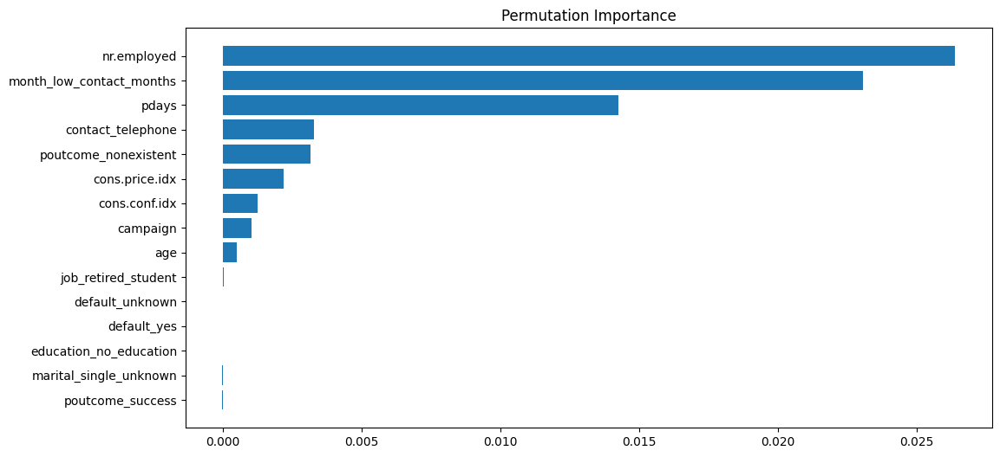

In [87]:
sorted_idx = r.importances_mean.argsort()
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), r.importances_mean[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X.columns)[sorted_idx])
plt.title('Permutation Importance')

### Red neuronal

In [106]:
r = permutation_importance(mlp_clf, X, y,
                            n_repeats=30,
                            random_state=0)

Text(0.5, 1.0, 'Permutation Importance')

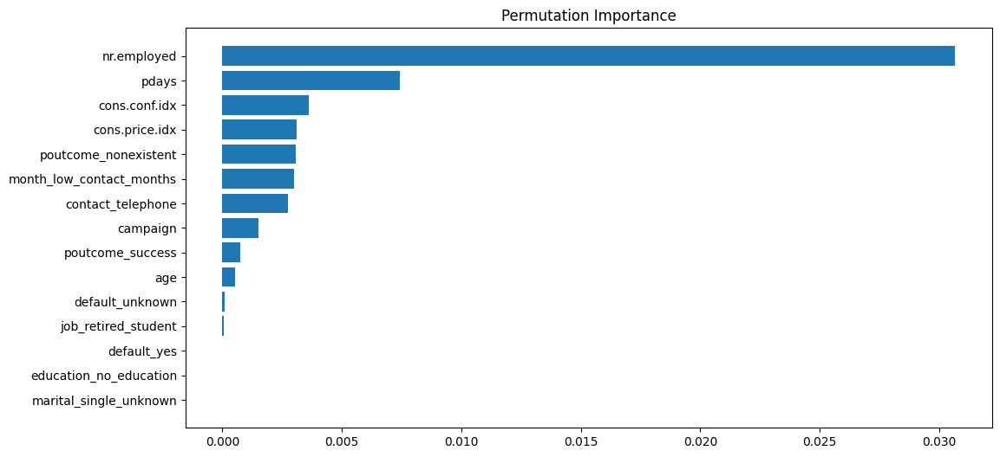

In [107]:
sorted_idx = r.importances_mean.argsort()
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), r.importances_mean[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X.columns)[sorted_idx])
plt.title('Permutation Importance')

##### Comparación

- Primero vemos que en regresión logística hay algunas variables que tienen PFI negativos, mala señal (mejora la precisión si alteramos esas variables).
- Vemos que en todos los modelos las variables edad, tipo de trabajo, educacion, estado civil (casado, soltero...) no son importantes.

## PDP

### Regresión Logística

In [108]:
clf=rg_lg

In [110]:
rg_lg.feature_names_in_

array(['age', 'campaign', 'pdays', 'cons.price.idx', 'cons.conf.idx',
       'nr.employed', 'job_retired_student', 'marital_single_unknown',
       'education_no_education', 'default_unknown', 'default_yes',
       'contact_telephone', 'month_low_contact_months',
       'poutcome_nonexistent', 'poutcome_success'], dtype=object)

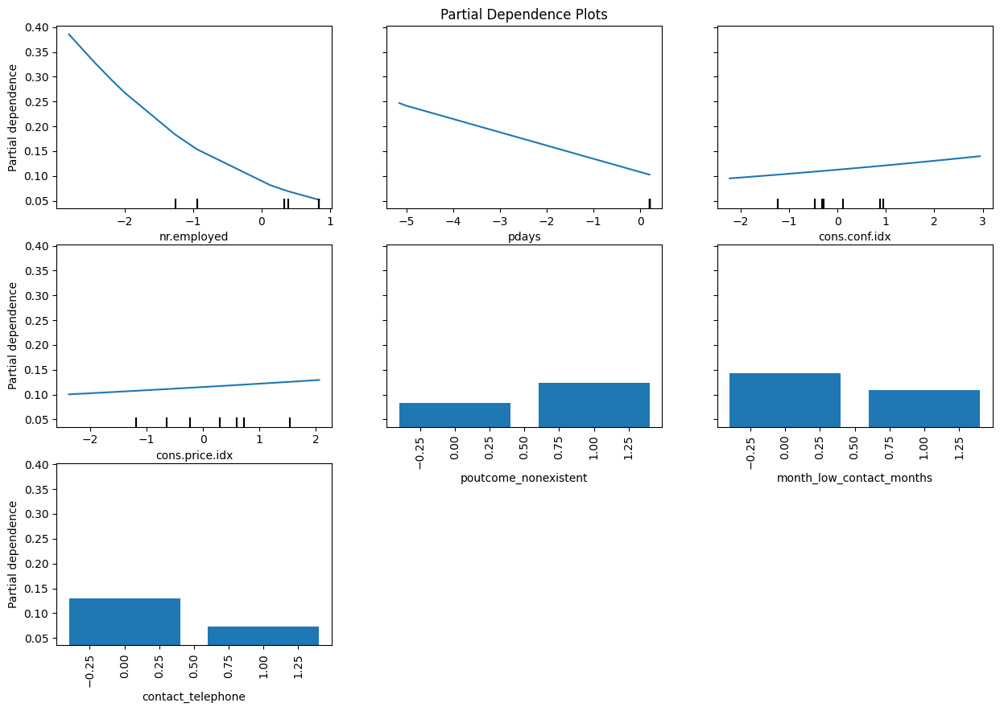

In [111]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_title("Partial Dependence Plots")
PartialDependenceDisplay.from_estimator(
    estimator=clf,
    X=X,
    features=(5, 2, 4, 3, 13, 12, 11), # the features to plot
    categorical_features = [13, 12, 11], # categorical features
    random_state=5,
    ax=ax,
)
plt.show()

### Random Forest

In [112]:
clf=rf_clf

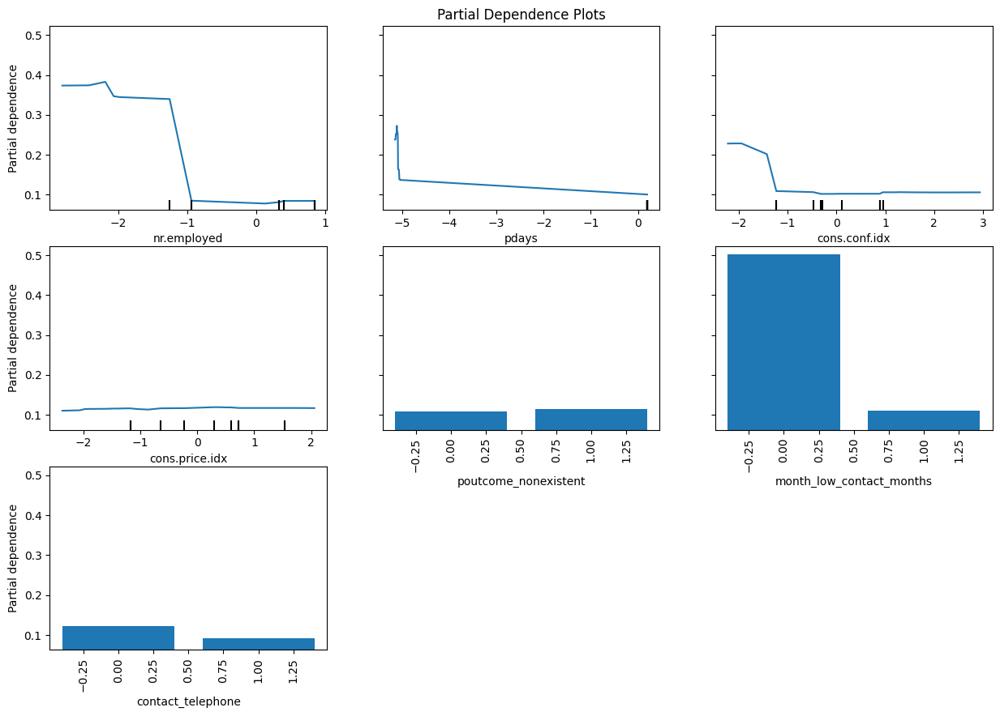

In [113]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_title("Partial Dependence Plots")
PartialDependenceDisplay.from_estimator(
    estimator=clf,
    X=X,
    features=(5, 2, 4, 3, 13, 12, 11), # the features to plot
    categorical_features = [13, 12, 11], # categorical features
    random_state=5,
    ax=ax,
)
plt.show()

### Red Neuronal

In [114]:
clf=mlp_clf

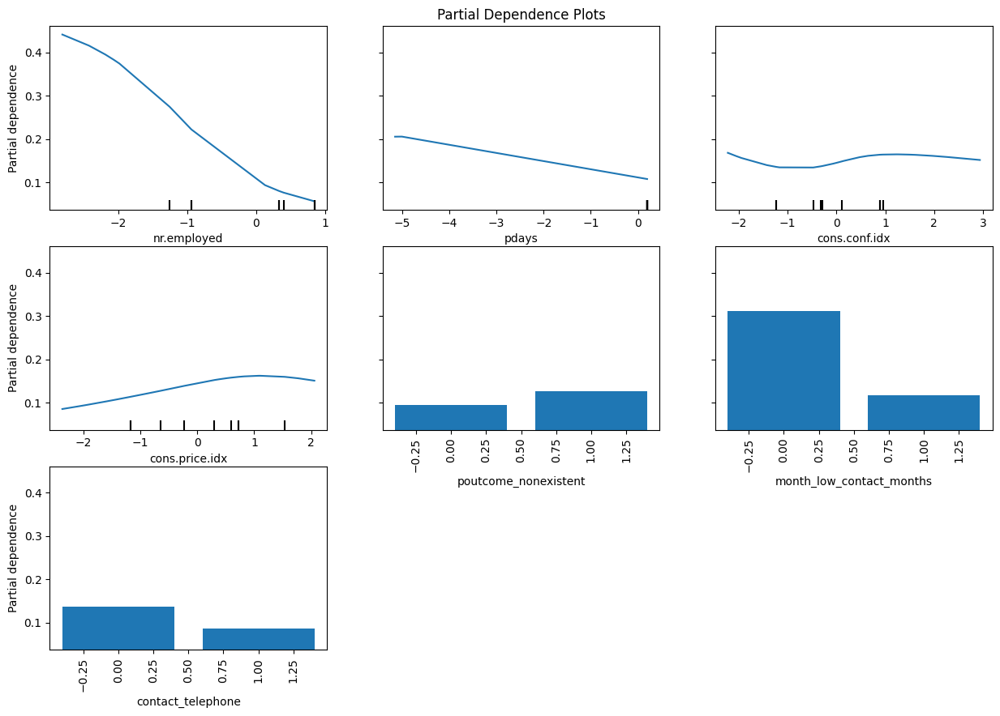

In [115]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_title("Partial Dependence Plots")
PartialDependenceDisplay.from_estimator(
    estimator=clf,
    X=X,
    features=(5, 2, 4, 3, 13, 12, 11), # the features to plot
    categorical_features = [13, 12, 11], # categorical features
    random_state=5,
    ax=ax,
)
plt.show()

## ALE

In [121]:
from alepython import ale_plot
feature_list=['nr.employed','cons.conf.idx','cons.price.idx']

### Regresión Logística

In [122]:
clf=rg_lg

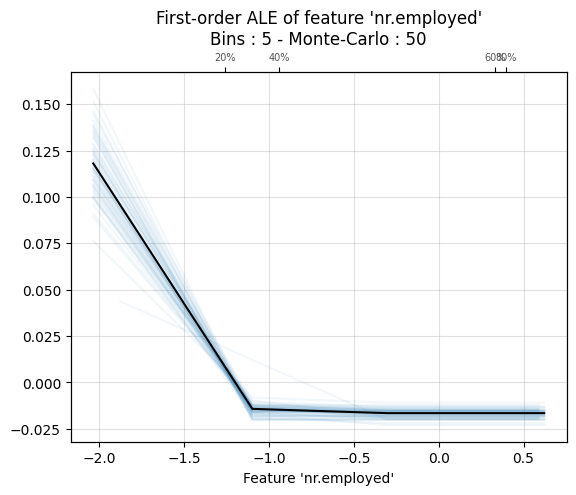

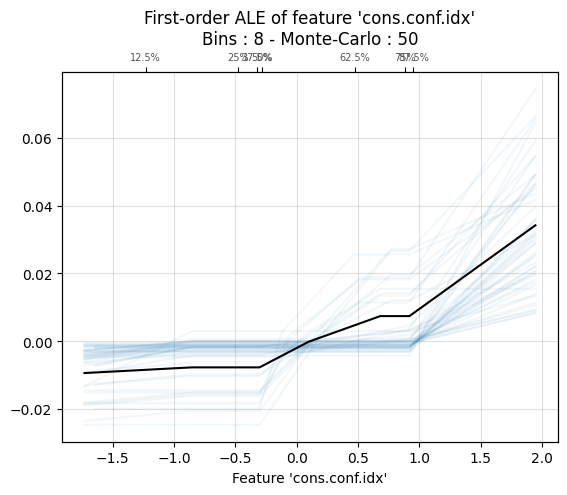

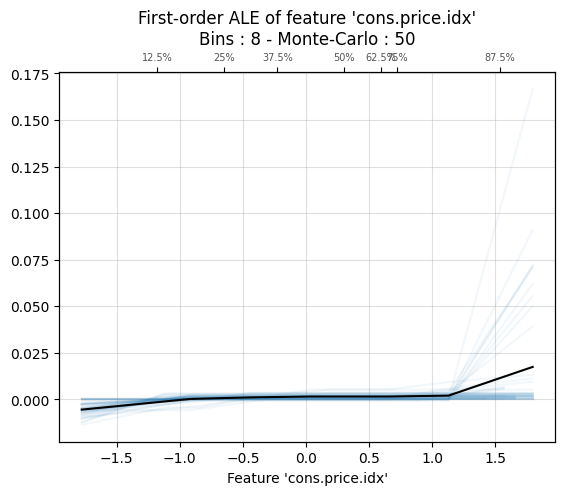

In [123]:
for feature in feature_list:
    # Plots ALE of feature 'cont' with Monte-Carlo replicas (default : 50).
    ale_plot(clf, X_test, feature, monte_carlo=True)

### Random Forest

In [124]:
clf=rf_clf

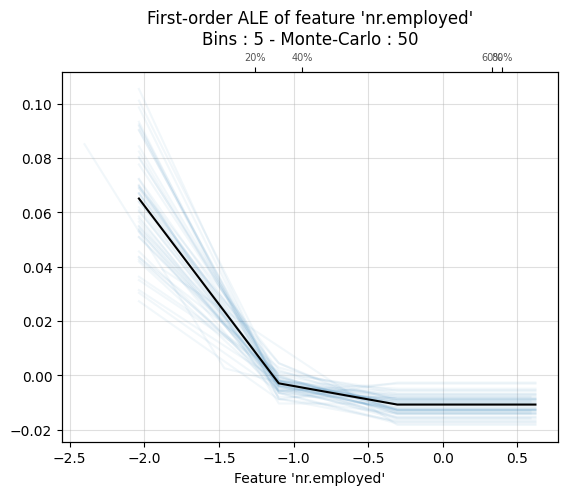

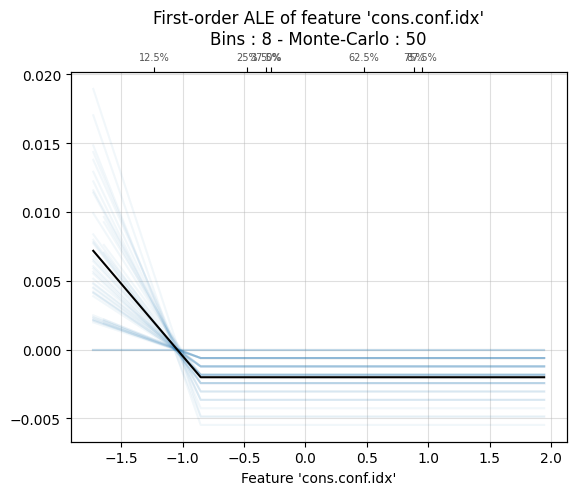

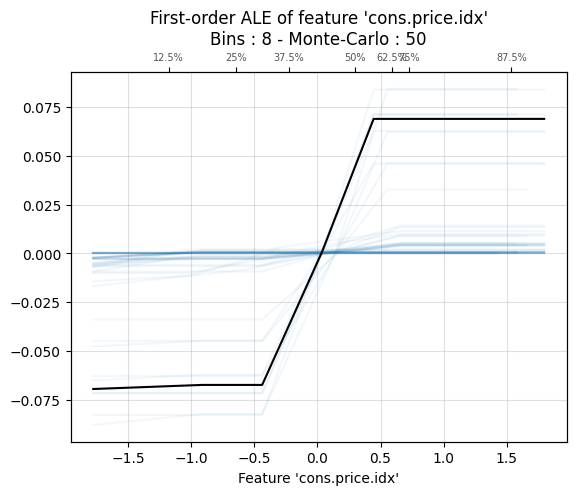

In [126]:
for feature in feature_list:
    # Plots ALE of feature 'cont' with Monte-Carlo replicas (default : 50).
    ale_plot(clf, X_test, feature, monte_carlo=True)

ENORME POTENCIAL COMPARAR CONS.PRICE.IDX EN PDP VS ALE

### Red Neuronal

In [127]:
clf=mlp_clf

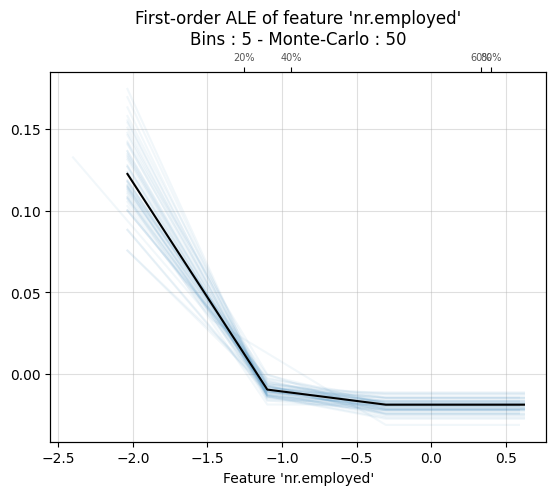

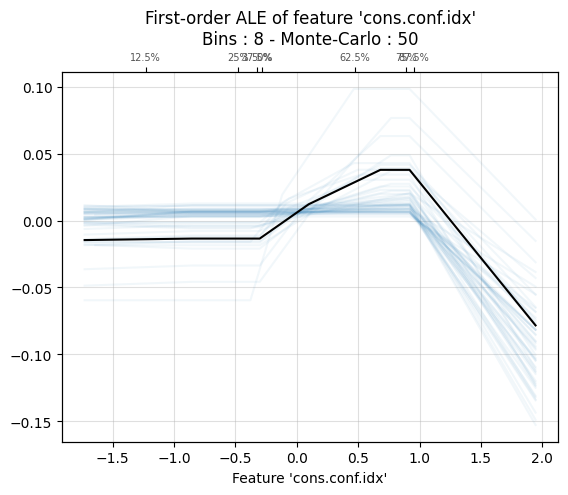

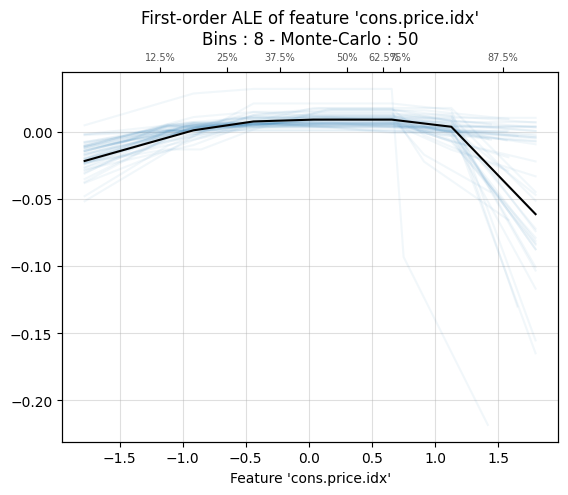

In [128]:
for feature in feature_list:
    # Plots ALE of feature 'cont' with Monte-Carlo replicas (default : 50).
    ale_plot(clf, X_test, feature, monte_carlo=True)

## SHAP

In [140]:
import shap
np.save('X_test.npy', X_test)
np.save('X_train.npy', X_train)


In [130]:
shap.initjs()

### Regresión Logística

In [131]:
clf=rg_lg

In [135]:
import shap
import pickle
import numpy as np

# Sample 1000 background data samples
background_samples = shap.sample(X_test, 100)

# Guardar los datos de fondo
np.save('SHAP_rg/background_samples.npy', background_samples)

# Create the explainer
explainer = shap.KernelExplainer(clf.predict_proba, background_samples)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Guardar el explainer y los SHAP values
with open('SHAP_rg/explainer.pkl', 'wb') as f:
    pickle.dump(explainer, f)

np.save('SHAP_rg/shap_values.npy', shap_values)

  0%|          | 0/8238 [00:00<?, ?it/s]

100%|██████████| 8238/8238 [1:49:58<00:00,  1.25it/s]


In [ ]:
import pickle
import numpy as np

# Cargar los datos de fondo
background_samples = np.load('SHAP_rg/background_samples.npy')

# Cargar el explainer
with open('SHAP_rg/explainer.pkl', 'rb') as f:
    explainer = pickle.load(f)

# Cargar los SHAP values
shap_values = np.load('SHAP_rg/shap_values.npy')


EJECUTADO CALCULOS NO HECHO VISUALIZACIÓN

### Random Forest

In [137]:
clf=rf_clf

In [139]:
import shap
import pickle
import numpy as np

# Sample 1000 background data samples
background_samples = shap.sample(X_test, 50)

# Guardar los datos de fondo
np.save('SHAP_rf/background_samples.npy', background_samples)

# Create the explainer
explainer = shap.TreeExplainer(clf.predict_proba, background_samples)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Guardar el explainer y los SHAP values
with open('SHAP_rf/explainer.pkl', 'wb') as f:
    pickle.dump(explainer, f)

np.save('SHAP_rf/shap_values.npy', shap_values)

100%|██████████| 8238/8238 [2:38:42<00:00,  1.16s/it]  


In [ ]:
import pickle
import numpy as np

# Cargar los datos de fondo
background_samples = np.load('SHAP_rf/background_samples.npy')

# Cargar el explainer
with open('SHAP_rf/explainer.pkl', 'rb') as f:
    explainer = pickle.load(f)

# Cargar los SHAP values
shap_values = np.load('SHAP_rf/shap_values.npy')


In [142]:
shap.initjs()

Visualización general de los valores SHAP.

In [ ]:
clf.feature_names_in_

array(['age', 'campaign', 'pdays', 'cons.price.idx', 'cons.conf.idx',
       'nr.employed', 'job_retired_student', 'marital_single_unknown',
       'education_no_education', 'default_unknown', 'default_yes',
       'contact_telephone', 'month_low_contact_months',
       'poutcome_nonexistent', 'poutcome_success'], dtype=object)

In [ ]:
# Definir nombres de características y etiquetas de destino (cáncer como ejemplo)
feature_names = ['age', 'campaign', 'pdays', 'cons.price.idx', 'cons.conf.idx',
       'nr.employed', 'job_retired_student', 'marital_single_unknown',
       'education_no_education', 'default_unknown', 'default_yes',
       'contact_telephone', 'month_low_contact_months',
       'poutcome_nonexistent', 'poutcome_success']  # Lista de nombres de características
target_names = ['y_yes']   # Lista de nombres de etiquetas objetivo

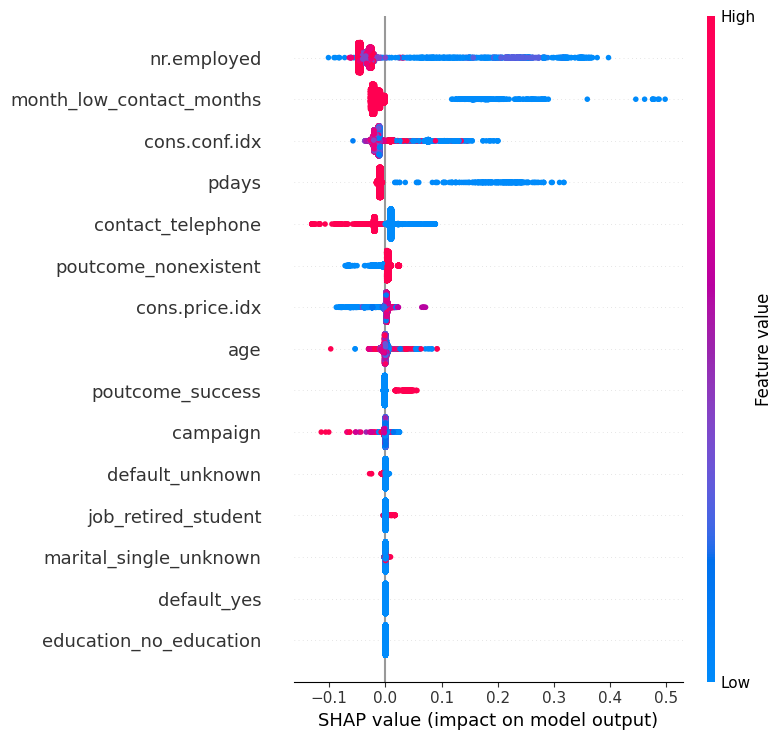

In [ ]:
i=1
shap.summary_plot(shap_values[i], features=X_test, 
                   feature_names=feature_names)

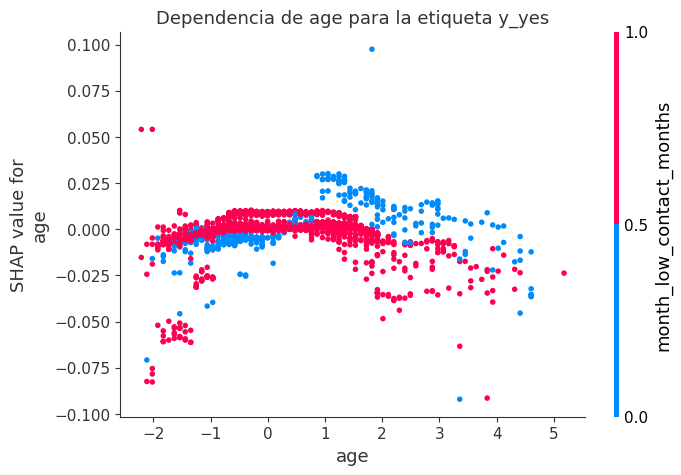

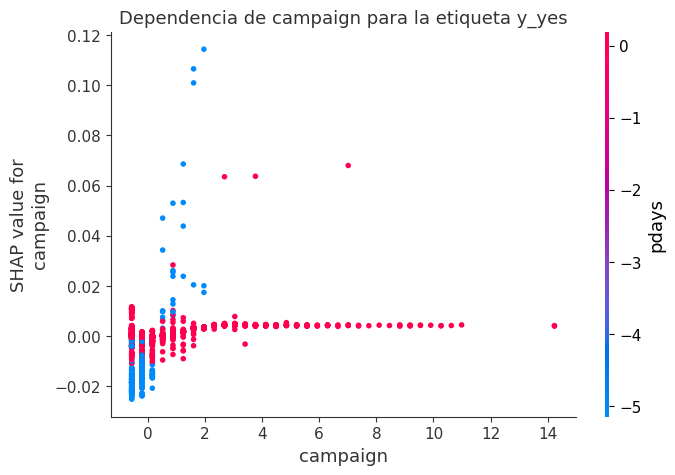

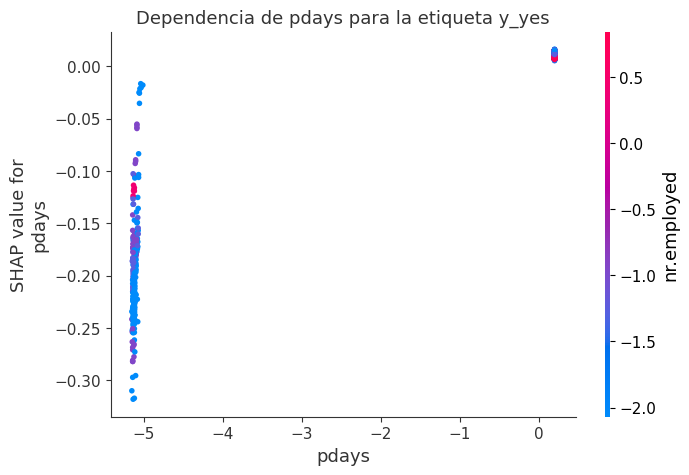

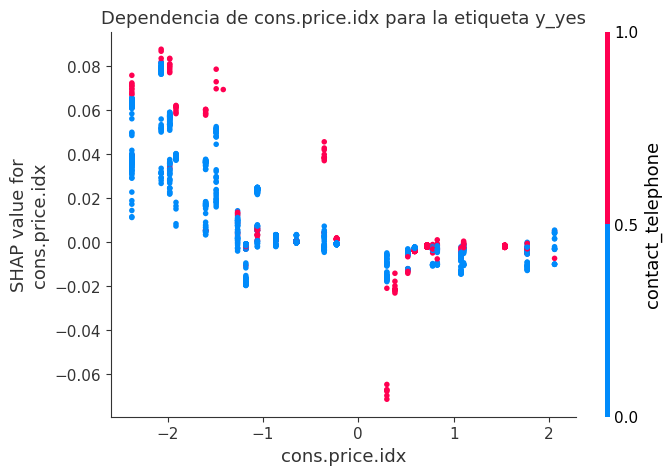

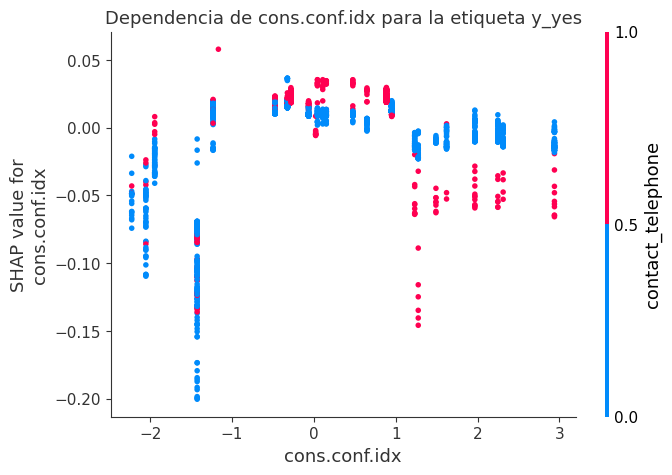

...

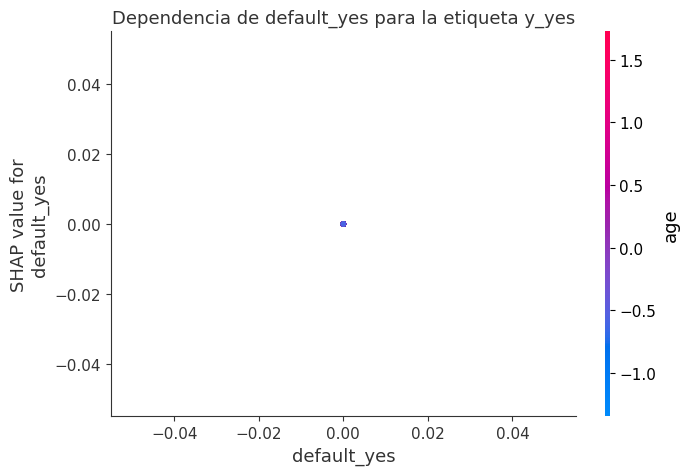

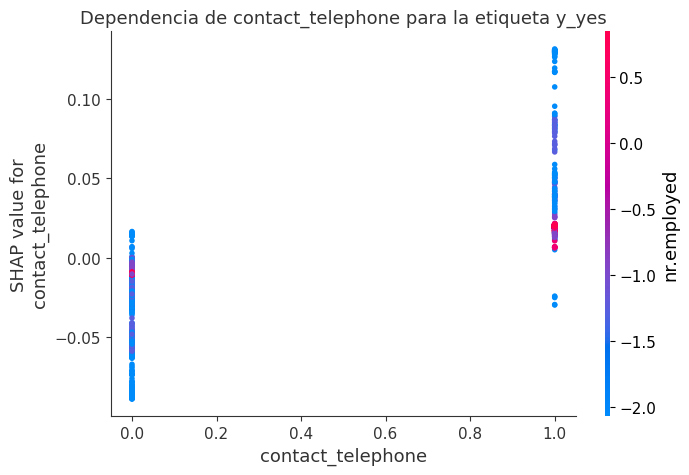

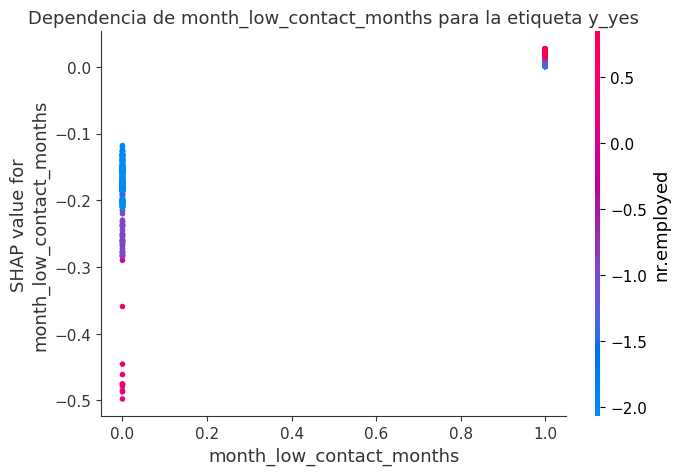

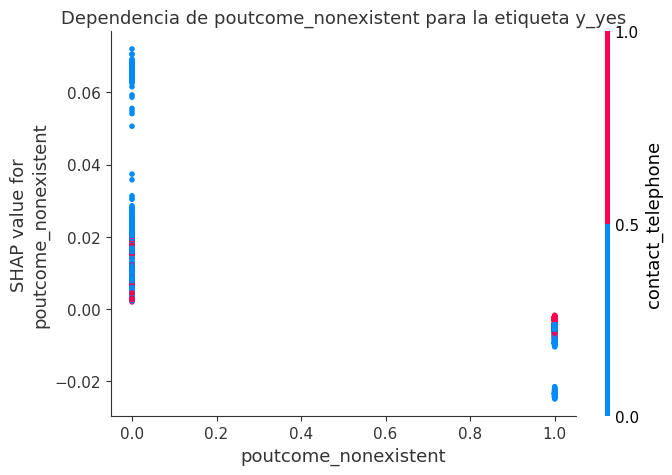

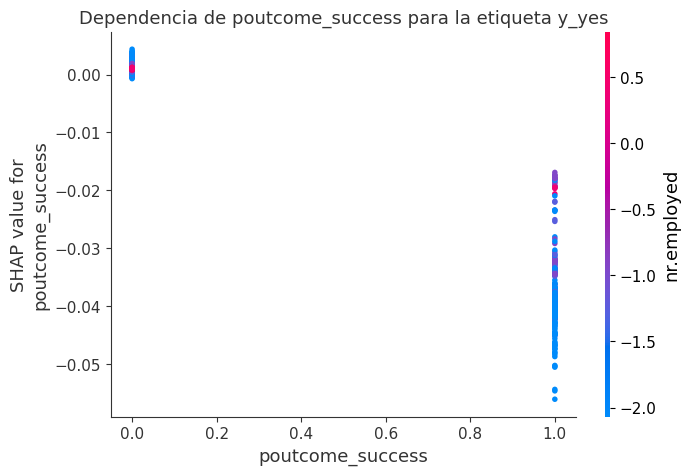

In [ ]:
# Visualizar gráficos de dependencia para cada característica y cada etiqueta objetivo
for feature_index, feature_name in enumerate(feature_names):
    for target_label, target_name in enumerate(target_names):
        shap.dependence_plot(
            feature_index, 
            shap_values[target_label], 
            features=X_test, 
            feature_names=feature_names,
            title=f"Dependencia de {feature_name} para la etiqueta {target_name}"
        )

plt.show()

Force Plot general.

In [170]:
'''
shap.force_plot(explainer.expected_value[1], shap_values[1], X_test)

plt.show()
'''
#DEMASIADO TIEMPO

  File "/home/gregorio/.local/lib/python3.8/site-packages/IPython/core/completer.py", line 3168, in _complete
    matcher(text), type=_UNKNOWN_TYPE
  File "/home/gregorio/.local/lib/python3.8/site-packages/IPython/core/completer.py", line 2339, in python_matches
    matches = self.global_matches(text)
  File "/home/gregorio/.local/lib/python3.8/site-packages/IPython/core/completer.py", line 1113, in global_matches
    for word in lst:
RuntimeError: dictionary changed size during iteration


'\nshap.force_plot(explainer.expected_value[1], shap_values[1], X_test)\n\nplt.show()\n'

In [171]:
len(X_test)

8238

In [169]:
# Submuestrear los datos
subsample_indices = np.random.choice(len(X_test), size=5000, replace=False)
X_test_subsampled = X_test.iloc[subsample_indices]
shap_values_subsampled = [shap_values[label][subsample_indices, :] for label in range(len(shap_values))]

# Visualizar el force plot para el subconjunto de datos subsampleado
shap.force_plot(explainer.expected_value[1], shap_values_subsampled[1], X_test_subsampled)

shap.plots.force is slow for many thousands of rows, try subsampling your data.


Force Plots específicos.

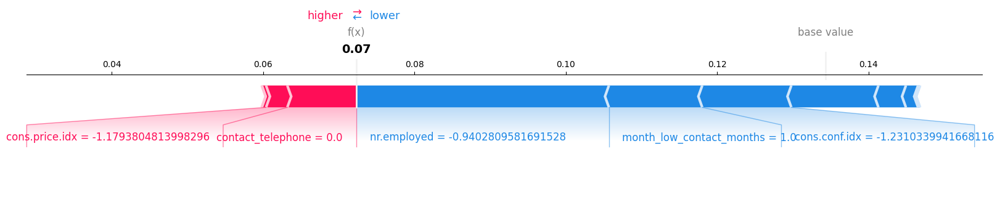

In [143]:
# Visualizar force plot para una instancia específica (por ejemplo, la primera instancia)
instance_index = 0

shap.force_plot(explainer.expected_value[1], shap_values[1][instance_index], X_test.iloc[instance_index], matplotlib=True)

plt.show()

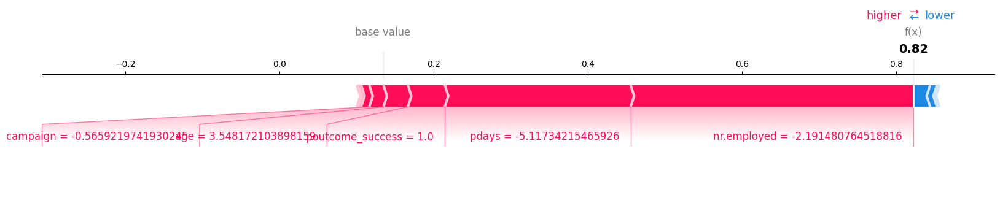

In [158]:
# Calcular las probabilidades de predicción para la clase positiva
probabilidades_positivas = clf.predict_proba(X_test)[:, 1]

# Encontrar el índice de la instancia con la probabilidad más alta para la clase positiva
indice_max_probabilidad_positiva = np.argmax(probabilidades_positivas)

# Visualizar el force plot para la instancia con la probabilidad más alta para la clase positiva
shap.force_plot(explainer.expected_value[1], shap_values[1][indice_max_probabilidad_positiva], X_test.iloc[indice_max_probabilidad_positiva], matplotlib=True)

plt.show()

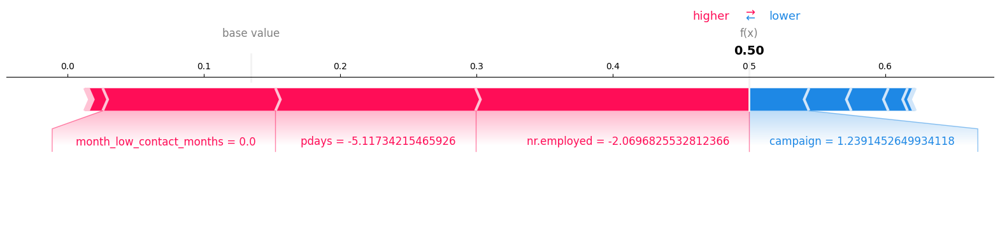

In [172]:
# Calcular las distancias entre las probabilidades predichas y 0.5
distancias_a_50_percent = np.abs(probabilidades_positivas - 0.5)

# Encontrar el índice de la instancia con la distancia mínima a 0.5
indice_cercano_a_50_percent = np.argmin(distancias_a_50_percent)

# Visualizar el force plot para la instancia con la probabilidad más cercana a 50%
shap.force_plot(explainer.expected_value[1], shap_values[1][indice_cercano_a_50_percent], X_test.iloc[indice_cercano_a_50_percent], matplotlib=True)

plt.show()

### Red Neuronal

In [173]:
clf=mlp_clf

In [175]:
import shap
import pickle
import numpy as np

# Sample 1000 background data samples
background_samples = shap.sample(X_test, 50)

# Guardar los datos de fondo
np.save('SHAP_mlp/background_samples.npy', background_samples)

# Create the explainer
explainer = shap.KernelExplainer(clf.predict_proba, background_samples)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test)

# Guardar el explainer y los SHAP values
with open('SHAP_mlp/explainer.pkl', 'wb') as f:
    pickle.dump(explainer, f)

np.save('SHAP_mlp/shap_values.npy', shap_values)

  0%|          | 0/8238 [00:00<?, ?it/s]

100%|██████████| 8238/8238 [1:37:45<00:00,  1.40it/s]


In [ ]:
import pickle
import numpy as np

# Cargar los datos de fondo
background_samples = np.load('SHAP_mlp/background_samples.npy')

# Cargar el explainer
with open('SHAP_mlp/explainer.pkl', 'rb') as f:
    explainer = pickle.load(f)

# Cargar los SHAP values
shap_values = np.load('SHAP_mlp/shap_values.npy')


In [176]:
shap.initjs()

Visualización general de los valores SHAP.

In [177]:
clf.feature_names_in_

array(['age', 'campaign', 'pdays', 'cons.price.idx', 'cons.conf.idx',
       'nr.employed', 'job_retired_student', 'marital_single_unknown',
       'education_no_education', 'default_unknown', 'default_yes',
       'contact_telephone', 'month_low_contact_months',
       'poutcome_nonexistent', 'poutcome_success'], dtype=object)

In [178]:
# Definir nombres de características y etiquetas de destino (cáncer como ejemplo)
feature_names = ['age', 'campaign', 'pdays', 'cons.price.idx', 'cons.conf.idx',
       'nr.employed', 'job_retired_student', 'marital_single_unknown',
       'education_no_education', 'default_unknown', 'default_yes',
       'contact_telephone', 'month_low_contact_months',
       'poutcome_nonexistent', 'poutcome_success']  # Lista de nombres de características
target_names = ['y_yes']   # Lista de nombres de etiquetas objetivo

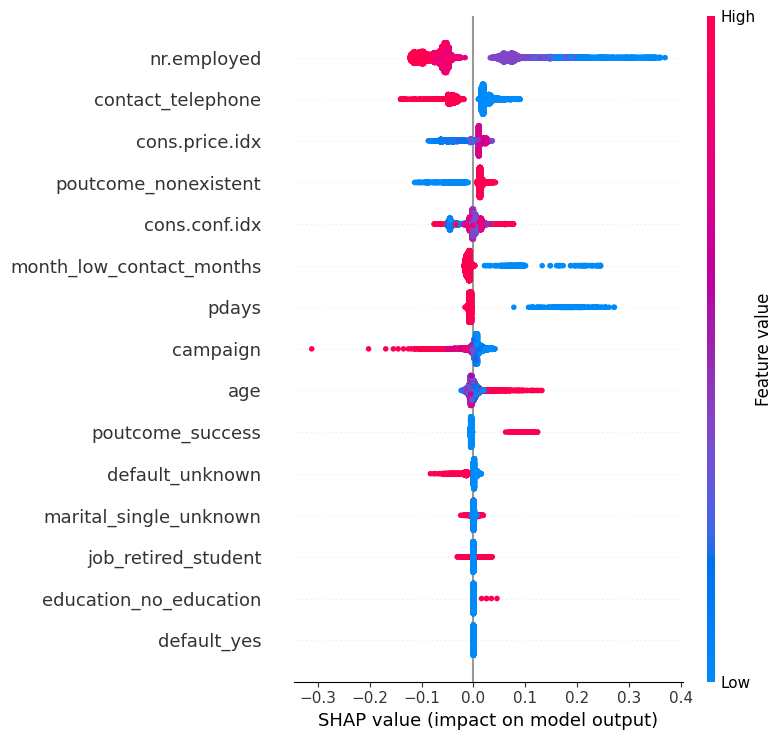

In [179]:
i=1
shap.summary_plot(shap_values[i], features=X_test, 
                   feature_names=feature_names)

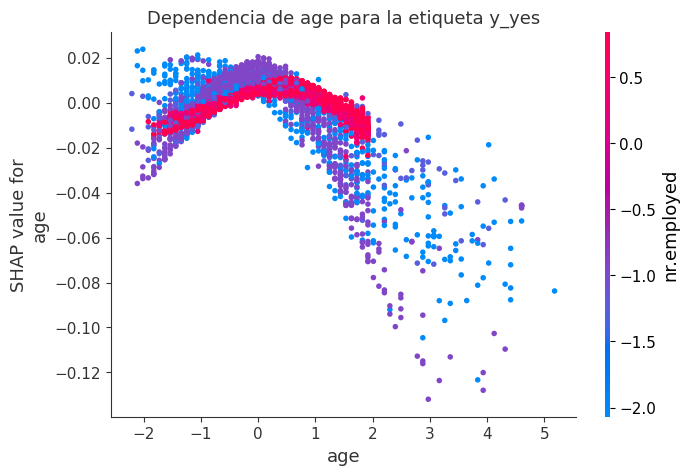

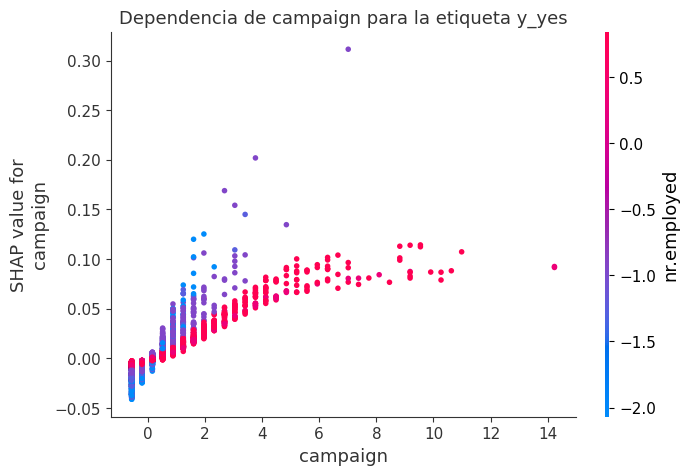

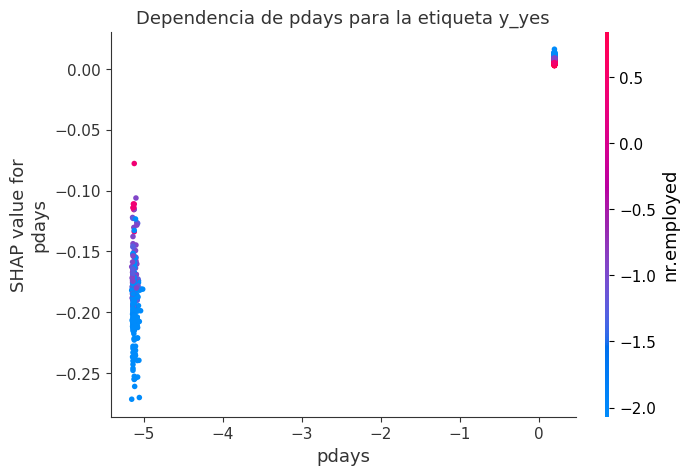

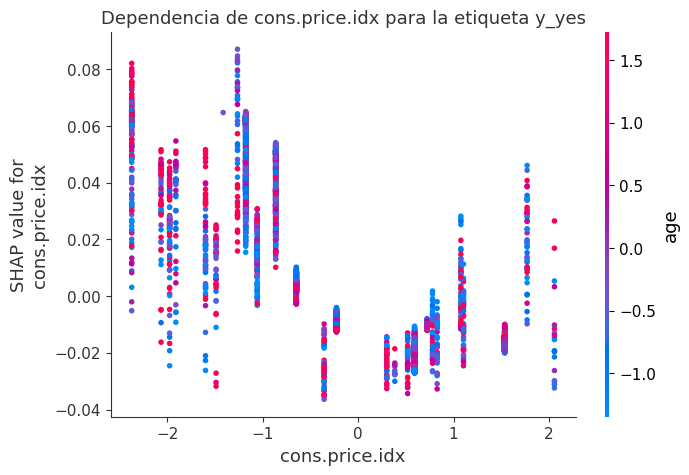

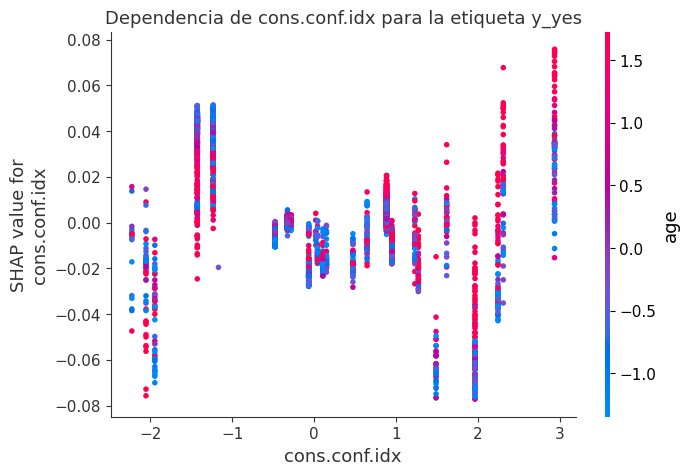

...

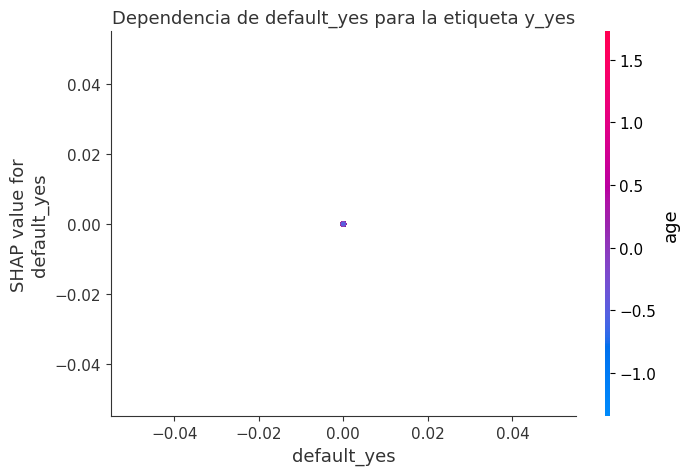

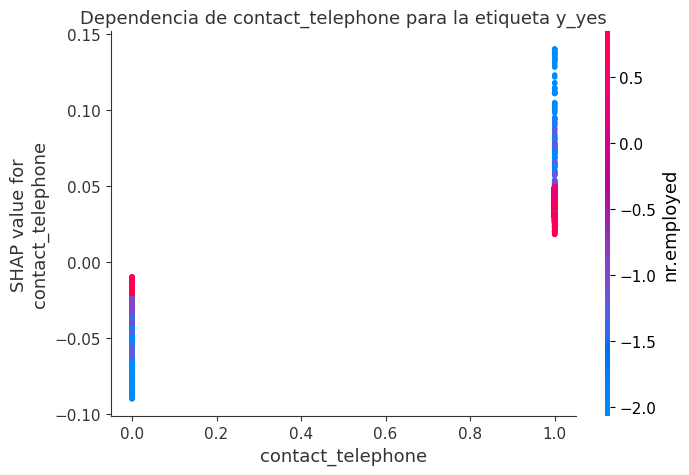

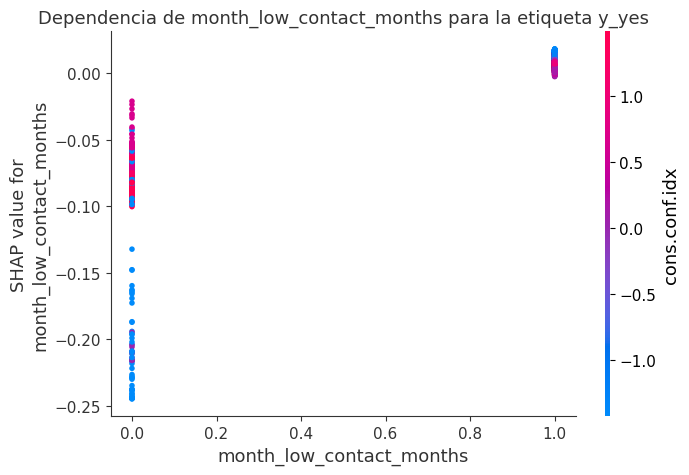

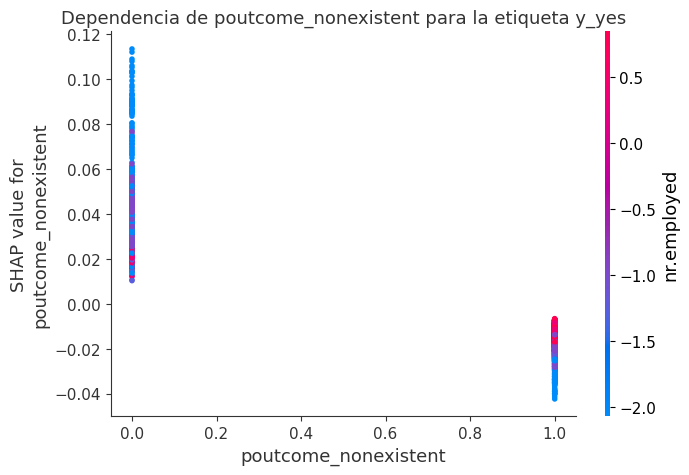

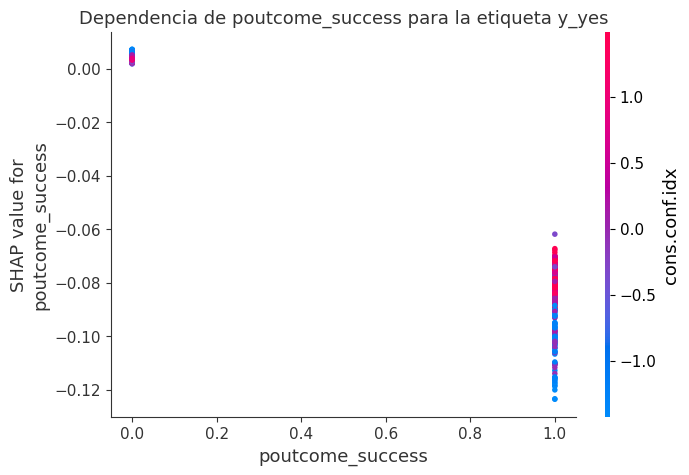

In [180]:
# Visualizar gráficos de dependencia para cada característica y cada etiqueta objetivo
for feature_index, feature_name in enumerate(feature_names):
    for target_label, target_name in enumerate(target_names):
        shap.dependence_plot(
            feature_index, 
            shap_values[target_label], 
            features=X_test, 
            feature_names=feature_names,
            title=f"Dependencia de {feature_name} para la etiqueta {target_name}"
        )

plt.show()

Force Plot general.

In [181]:
'''
shap.force_plot(explainer.expected_value[1], shap_values[1], X_test)

plt.show()
'''
#DEMASIADO TIEMPO

'\nshap.force_plot(explainer.expected_value[1], shap_values[1], X_test)\n\nplt.show()\n'

In [182]:
len(X_test)

8238

In [183]:
# Submuestrear los datos
subsample_indices = np.random.choice(len(X_test), size=5000, replace=False)
X_test_subsampled = X_test.iloc[subsample_indices]
shap_values_subsampled = [shap_values[label][subsample_indices, :] for label in range(len(shap_values))]

# Visualizar el force plot para el subconjunto de datos subsampleado
shap.force_plot(explainer.expected_value[1], shap_values_subsampled[1], X_test_subsampled)

shap.plots.force is slow for many thousands of rows, try subsampling your data.


Force Plots específicos.

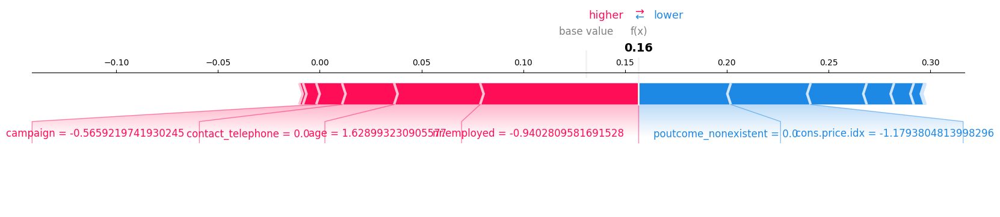

In [184]:
# Visualizar force plot para una instancia específica (por ejemplo, la primera instancia)
instance_index = 0

shap.force_plot(explainer.expected_value[1], shap_values[1][instance_index], X_test.iloc[instance_index], matplotlib=True)

plt.show()

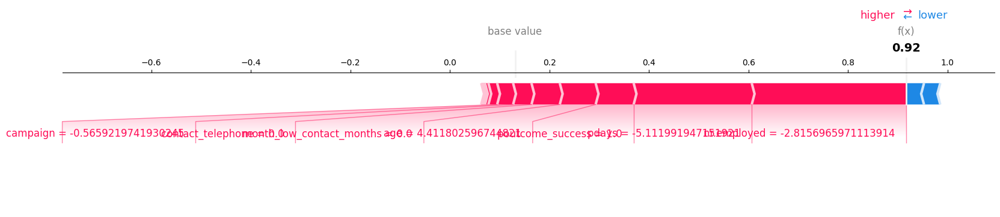

In [185]:
# Calcular las probabilidades de predicción para la clase positiva
probabilidades_positivas = clf.predict_proba(X_test)[:, 1]

# Encontrar el índice de la instancia con la probabilidad más alta para la clase positiva
indice_max_probabilidad_positiva = np.argmax(probabilidades_positivas)

# Visualizar el force plot para la instancia con la probabilidad más alta para la clase positiva
shap.force_plot(explainer.expected_value[1], shap_values[1][indice_max_probabilidad_positiva], X_test.iloc[indice_max_probabilidad_positiva], matplotlib=True)

plt.show()

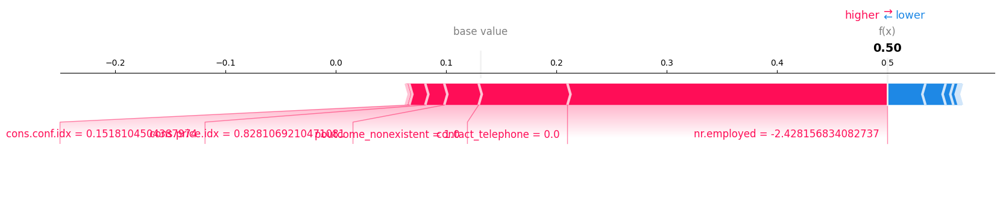

In [186]:
# Calcular las distancias entre las probabilidades predichas y 0.5
distancias_a_50_percent = np.abs(probabilidades_positivas - 0.5)

# Encontrar el índice de la instancia con la distancia mínima a 0.5
indice_cercano_a_50_percent = np.argmin(distancias_a_50_percent)

# Visualizar el force plot para la instancia con la probabilidad más cercana a 50%
shap.force_plot(explainer.expected_value[1], shap_values[1][indice_cercano_a_50_percent], X_test.iloc[indice_cercano_a_50_percent], matplotlib=True)

plt.show()